In [ ]:
# Import the necessary packages for the whole script
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal, Independent, TransformedDistribution
from torch.distributions.transforms import TanhTransform
import gymnasium as gym
import mujoco
from matplotlib.collections import LineCollection
import matplotlib.cm as cm
import numpy as np
import math
import random
import matplotlib.pyplot as plt
import minari
from torch.utils.data import Dataset, DataLoader
import wandb
import os
from matplotlib.patches import Ellipse
import re
import time

from model.skill_model import SkillPolicy, SkillPosterior, SkillPrior, TAWM


device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
NUM_NEURONS = 256
Z_DIM = 256

In [3]:
def load_checkpoint(path, q_phi, pi_theta, p_psi, p_omega, strict=True):
    ckpt = torch.load(path, weights_only=False, map_location=torch.device('cpu'))
    q_phi.load_state_dict(ckpt["q_phi"], strict=strict)
    pi_theta.load_state_dict(ckpt["pi_theta"], strict=strict)
    p_psi.load_state_dict(ckpt["p_psi"], strict=strict)
    p_omega.load_state_dict(ckpt["p_omega"], strict=strict)
    stats = ckpt.get("S_stats", None)
    if stats is not None:
        global S_mean, S_std
        S_mean, S_std = stats["mean"], stats["std"]
    print(f"[checkpoint] loaded <- {path}")
    return ckpt

# B, the number of subtrajectories per batch 
B = 100

# T, the length of each subtrajectory
T = 40

# AntMaze state and action dims
state_dim = 29
action_dim = 8
q_phi = SkillPosterior(state_dim=state_dim, action_dim=action_dim).to(device)
pi_theta = SkillPolicy(state_dim=state_dim, action_dim=action_dim).to(device)
p_psi = TAWM(state_dim=state_dim).to(device)
p_omega = SkillPrior(state_dim=state_dim).to(device)


checkpoint = "checkpoints/antmaze_diverse_test_detached_250_1.pth"

def _safe(s: str) -> str:
    return re.sub(r"[^a-zA-Z0-9._-]+", "_", str(s))

def ckpt_tag_from_path(path: str) -> str:
    return _safe(os.path.splitext(os.path.basename(path))[0])

CKPT_TAG = ckpt_tag_from_path(checkpoint)  
PLOT_DIR = os.path.join("plots", CKPT_TAG)
os.makedirs(PLOT_DIR, exist_ok=True)

def _stamp_ckpt(ax, ckpt_tag=CKPT_TAG):
    # add ckpt to title + corner stamp
    title = ax.get_title() or ""
    if ckpt_tag not in title:
        ax.set_title((title + "\n" if title else "") + f"ckpt: {ckpt_tag}")
    ax.text(
        0.99, 0.01, f"ckpt: {ckpt_tag}",
        transform=ax.transAxes,
        ha="right", va="bottom",
        fontsize=9, alpha=0.7
    )

def save_fig(fig, stem: str, meta: dict | None = None, out_dir=PLOT_DIR, ckpt_tag=CKPT_TAG, close=False):
    os.makedirs(out_dir, exist_ok=True)
    meta = meta or {}
    stamp = time.strftime("%Y%m%d-%H%M%S")
    parts = [stem, f"ckpt-{ckpt_tag}", stamp] + [f"{k}-{meta[k]}" for k in sorted(meta.keys())]
    fname = "__".join(_safe(p) for p in parts) + ".png"
    path = os.path.join(out_dir, fname)
    fig.savefig(path, dpi=200, bbox_inches="tight")
    if close:
        plt.close(fig)
    return path


_ = load_checkpoint(checkpoint, q_phi, pi_theta, p_psi, p_omega)
q_phi.eval(); pi_theta.eval(); p_psi.eval(); p_omega.eval()

ant_maze_dataset = minari.load_dataset('D4RL/antmaze/medium-diverse-v1')


[checkpoint] loaded <- checkpoints/antmaze_diverse_test_detached_250_1.pth


# HELPERS

In [4]:
def to_torch(x):
    return torch.as_tensor(x, dtype=torch.float32, device=device)

def policy_dist(mu, std):
    # build a tanh-squashed normal action dist
    base = Independent(Normal(mu, std.clamp_min(0.05)), 1) # clamps std to be at least 0.05 to prevent exploding/vanishing gradients
    return TransformedDistribution(base, [TanhTransform(cache_size=1)]) # Creates a Independent Normal over action dims applied Tanh Transform to map actions to (-1, 1)

def standardize_state(s): 
    return (s - S_mean) / S_std

def unstandardize_state(s):
    return s * S_std + S_mean

def pack_state_from_obs(obs):
    """
    Build 29-d state (observation + achieved goal).
    """
    obs_vec = np.asarray(obs["observation"], dtype=np.float32).ravel()
    ag = np.asarray(obs.get("achieved_goal", obs_vec[:2]), dtype=np.float32).ravel()

    state = np.concatenate([obs_vec.astype(np.float32), ag.astype(np.float32)], 0) # Combines the 27-d and 2-d tensors
    return obs_vec.astype(np.float32), ag.astype(np.float32), state

def get_sim_handles(env):
    """Unwraps Gym wrappers to access MuJoCo model and data to work with qpos/qvel and forward dynamics. 
    Return (unwrapped MuJoCo environment, MuJoCo model, muJoCo data)"""
    t = env
    for attr in ["env", "unwrapped"]: # for the current env, replace env with env.env and then find env.env.unwrapped
        if hasattr(t, attr):
            t = getattr(t, attr)
    # t should now be the innermost env and grab the MuJoCo data and model
    # sim = getattr(t, "sim", None)
    # if sim is not None and hasattr(sim, "model") and hasattr(sim, "data"):
    #     return t, sim.model, sim.data
    
    # CHECK THIS
    if hasattr(t, "model") and hasattr(t, "data"):
        return t, t.model, t.data

def split_obs_to_qpos_qvel(s0_obs, s0_ag, env):
    """Split dataset obs into qpos and qvel to reset physics. Need to provide exact qpos and qvel to reset dataset state"""
    _, model, data = get_sim_handles(env)
    nq, nv = int(model.nq), int(model.nv)  

    s0_obs = np.asarray(s0_obs, np.float32).ravel()
    s0_ag  = np.asarray(s0_ag,  np.float32).ravel()

    qpos = data.qpos.ravel().copy()
    qvel = data.qvel.ravel().copy()

    # fill exact slices
    qpos[0:2] = s0_ag
    qpos[2:nq] = s0_obs[:(nq - 2)]
    qvel[:nv] = s0_obs[(nq - 2):(nq - 2 + nv)]

    return qpos.astype(np.float32), qvel.astype(np.float32)

def read_antmaze_obs(env):
    """Reconstruct AntMaze dict-observation from MuJoCo state."""
    t = env
    for attr in ("env", "unwrapped"):
        if hasattr(t, attr):
            t = getattr(t, attr)
    qpos = t.data.qpos.ravel()
    qvel = t.data.qvel.ravel()
    obs27 = np.concatenate([qpos[2:], qvel]).astype(np.float32)
    ag2 = qpos[:2].astype(np.float32)
    return {"observation": obs27, "achieved_goal": ag2}

def set_env_state(env, qpos, qvel):
    """Write qpos/qvel into MuJoCo and forward."""
    _, model, data = get_sim_handles(env)
    # Set the physical state
    data.qpos[:] = qpos
    data.qvel[:] = qvel
    # Required step after makeing a manual state change
    mujoco.mj_forward(model, data)

def recover_ant_env():
    return ant_maze_dataset.recover_environment()

In [5]:
def plot_xy_trajectories(trajs_xy, title="", save=False, stem="traj_detail", meta=None):
    """
    Plots each trajectory as a line with start plotted as circle, end as star
    """
    fig, ax = plt.subplots(figsize=(6.8, 6))

    colors = cm.get_cmap("viridis", len(trajs_xy))

    # Plot each of the trajectories 
    for i, xy in enumerate(trajs_xy):
        c = colors(i)# set the color for the trajectory
        ax.plot(xy[:,0], xy[:,1], '-', lw=1.5, alpha=0.9, color=c, label=f"traj {i}") # draw the path
        ax.scatter(xy[0,0],  xy[0,1],  s=40, marker='o', color=c, edgecolor='k', zorder=3) # draw the start
        ax.scatter(xy[-1,0], xy[-1,1], s=70, marker='*', color=c, edgecolor='k', zorder=3) # draw the end
        tcolors = np.linspace(0, 1, len(xy)) 
        ax.scatter(xy[:,0], xy[:,1], c=tcolors, cmap="viridis", s=14, alpha=0.8) # points along trajectory get brighter

    ax.set_aspect('equal', 'box')
    all_xy = np.concatenate(trajs_xy, axis=0)
    lo = all_xy.min(axis=0)
    hi = all_xy.max(axis=0)
    ax.set_xlim(lo[0], hi[0])
    ax.set_ylim(lo[1], hi[1])
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    ax.legend(loc="best", fontsize=8)
    plt.tight_layout()
    path = None
    if save:
        path = save_fig(fig, stem=stem, meta=meta, close=False)

    plt.show()
    return fig, path

@torch.no_grad()
def sample_tawm_predictions(s0_env, z, N_samples=200):
    """Sample predicted terminal states from p_psi(s_T | s0, z)."""
    s0_t = to_torch(standardize_state(s0_env)).unsqueeze(0)
    mu_T, std_T = p_psi(s0_t, z.unsqueeze(0))  
    dist = Independent(Normal(mu_T, std_T), 1)
    sT_samples_std = dist.sample((N_samples,)).squeeze(1).cpu().numpy()
    sT_samples = unstandardize_state(sT_samples_std)
    xy_samples = sT_samples[:, -2:]  
    return xy_samples

def draw_cov_ellipse(ax, mean, cov, n_std=2.0, **kwargs):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))
    width, height = 2 * n_std * np.sqrt(vals)
    ellip = Ellipse(xy=mean, width=width, height=height, angle=theta, fill=False, **kwargs)
    ax.add_patch(ellip)

def plot_xy_trajectories(trajs_xy, title="", xy_samples=None, save=False, stem="traj_detail", meta=None):
    
    fig, ax = plt.subplots(figsize=(6.8, 6))
    colors = cm.get_cmap("viridis", len(trajs_xy))

    for i, xy in enumerate(trajs_xy):
        c = colors(i)
        ax.plot(xy[:,0], xy[:,1], '-', lw=1.5, alpha=0.9, color=c)
        ax.scatter(xy[0,0], xy[0,1], s=40, marker='o', color=c, edgecolor='k', zorder=3)
        ax.scatter(xy[-1,0], xy[-1,1], s=70, marker='*', color=c, edgecolor='k', zorder=3)
        tcolors = np.linspace(0, 1, len(xy))
        ax.scatter(xy[:,0], xy[:,1], c=tcolors, cmap="viridis", s=14, alpha=0.8)

    if xy_samples is not None:
        ax.scatter(
            xy_samples[:, 0], xy_samples[:, 1],
            s=18, alpha=0.35, c='orange', edgecolors='none', zorder=2, label="TAWM samples"
        )
        cov = np.cov(xy_samples.T)
        mean = xy_samples.mean(axis=0)
        draw_cov_ellipse(ax, mean, cov, edgecolor='darkorange', lw=2, alpha=0.9)

    # bounds: include samples if provided
    all_xy = np.concatenate(trajs_xy, axis=0)
    if xy_samples is not None:
        all_xy = np.vstack([all_xy, xy_samples])
    lo, hi = all_xy.min(axis=0), all_xy.max(axis=0)
    pad = 0.05 * (hi - lo + 1e-9)
    ax.set_xlim(lo[0]-pad[0], hi[0]+pad[0])
    ax.set_ylim(lo[1]-pad[1], hi[1]+pad[1])

    ax.set_aspect('equal', 'box')
    ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_title(title)
    ax.grid(True, alpha=0.3)
    ax.legend(loc="best")

    plt.tight_layout()
    path = None
    if save:
        path = save_fig(fig, stem=stem, meta=meta, close=False)

    plt.show()
    return fig, path

@torch.no_grad()
def rollout_xy_trajectories(
    env,
    s0_obs_ds,
    s0_ag_ds=None,
    N_trajs=3,
    horizon=40,
    seed=0,
    resample_skill_per_traj=True,
    use_prior=True,
    z_fixed=None,
):
    """
    Reset the env to the same physical start state, sample a skill z from
    p_omega(z|s0) (or use a fixed z), and roll out pi_theta(a|s,z) for `horizon` steps.
    """
    H = horizon
    np.random.seed(seed)
    torch.manual_seed(seed)

    # Extract the qpos and qvel of the chosen start state (dataset state)
    s0_qpos, s0_qvel = split_obs_to_qpos_qvel(s0_obs_ds, s0_ag_ds, env)

    trajs_xy, zs_used = [], []

    # Precompute a global z if we want the same skill for all trajectories
    z_global = None
    if not resample_skill_per_traj:
        env.reset()
        set_env_state(env, s0_qpos, s0_qvel)

        # Get env observation for exact start
        obs = read_antmaze_obs(env)
        _, _, s0_env = pack_state_from_obs(obs) # 29-d state
        s0_t = to_torch(s0_env).unsqueeze(0)

        if z_fixed is not None:
            z_global = z_fixed.to(device).detach().clone().squeeze(0)
        elif use_prior:
            mu_pr, std_pr = p_omega(s0_t)
            z_global = (mu_pr + std_pr * torch.randn_like(mu_pr)).squeeze(0)

    for k in range(N_trajs):
        env.reset()
        # Reset sim to the same physical start
        set_env_state(env, s0_qpos, s0_qvel)

        obs = read_antmaze_obs(env)
        _, ag0, s0_env = pack_state_from_obs(obs) # s0_env shape [29]
        s0_t = to_torch(s0_env).unsqueeze(0)

        # Choose skill for this trajectory
        if resample_skill_per_traj:
            if z_fixed is not None:
                z = z_fixed.to(device).detach().clone().squeeze(0)
            elif use_prior:
                mu_pr, std_pr = p_omega(s0_t)
                z = (mu_pr + std_pr * torch.randn_like(mu_pr)).squeeze(0)
        else:
            z = z_global

        zs_used.append(z.detach().cpu())

        # Rollout and collect (x,y) using pi_theta(a|s,z)
        xy = [ag0.copy()]
        pi_theta.eval()
        cur_obs = obs
        for t in range(H):
            _, _, st = pack_state_from_obs(cur_obs) # 29-d state
            st_t = to_torch(st).unsqueeze(0) # [1, state_dim]
            a_mu, a_std = pi_theta(st_t, z.unsqueeze(0))
            a_dist = policy_dist(a_mu, a_std)
            a = a_dist.sample().squeeze(0).cpu().numpy().astype(np.float32)

            cur_obs, _, term, trunc, _ = env.step(a)
            _, ag_t, _ = pack_state_from_obs(cur_obs)
            xy.append(ag_t.copy())
            if term or trunc:
                break

        trajs_xy.append(np.stack(xy, axis=0))

    return trajs_xy, zs_used, s0_env

def endpoints_from_trajs(trajs_xy):
    """Return N x 2 array of final (x,y)"""
    return np.stack([traj[-1] for traj in trajs_xy], axis=0)

@torch.no_grad()
def tawm_xy_gaussian(s0_env, z):
    """
    Get mean and 2x2 covariance of TAWM's terminal XY
    """
    s0_t = to_torch(s0_env).unsqueeze(0)  
    z_t  = z.unsqueeze(0).to(device)      
    mu_T, std_T = p_psi(s0_t, z_t)      
    mu_T  = mu_T.squeeze(0).cpu().numpy()
    std_T = std_T.squeeze(0).cpu().numpy()

    mean_xy = mu_T[-2:]
    std_xy  = std_T[-2:]
    cov_xy  = np.diag(std_xy**2)
    return mean_xy, cov_xy

def plot_endpoints_vs_tawm(trajs_xy, s0_env, z, s0_xy=None, title="Endpoints vs TAWM",
                           save=False, stem="endpoints_vs_tawm", meta=None):
    fig, ax = plt.subplots(figsize=(6.8, 6))

    end_xy = endpoints_from_trajs(trajs_xy)

    # TAWM ellipse from mean/std 
    mean_pred, cov_pred = tawm_xy_gaussian(s0_env, z)

    draw_cov_ellipse(ax, mean_pred, cov_pred, n_std=1.0,
                     edgecolor='darkorange', linewidth=2, label="TAWM 1sigma")
    draw_cov_ellipse(ax, mean_pred, cov_pred, n_std=2.0,
                     edgecolor='orange', linestyle='--', linewidth=1.5, label="TAWM 2sigma")

    # Policy endpoints 
    ax.scatter(end_xy[:,0], end_xy[:,1], s=70, marker='*', edgecolor='k',
               linewidths=0.6, label="Policy endpoints")
    if s0_xy is not None:
        ax.scatter([s0_xy[0]], [s0_xy[1]], s=60, c='tab:green', marker='o',
                   edgecolor='k', linewidths=0.6, label="Start (s0)")
    ax.scatter([mean_pred[0]], [mean_pred[1]], c='darkorange', s=50,
               marker='X', label="TAWM mean")
    mean_end = end_xy.mean(axis=0)
    ax.scatter([mean_end[0]], [mean_end[1]], c='tab:blue', s=50,
               marker='X', label="Endpoints mean")

    # max radius (in x/y) from the largest eigenvalue of cov and max n_std=2
    eigvals = np.linalg.eigvalsh(cov_pred)
    max_std = np.sqrt(eigvals.max())
    max_n_std = 2.0
    r = max_n_std * max_std  

    all_pts = [end_xy, mean_pred[None, :]]
    if s0_xy is not None:
        all_pts.append(s0_xy[None, :])
    all_pts = np.vstack(all_pts)

    lo, hi = all_pts.min(axis=0), all_pts.max(axis=0)
    lo = np.minimum(lo, mean_pred - r)
    hi = np.maximum(hi, mean_pred + r)

    pad = 0.06 * (hi - lo + 1e-9)
    ax.set_xlim(lo[0] - pad[0], hi[0] + pad[0])
    ax.set_ylim(lo[1] - pad[1], hi[1] + pad[1])

    ax.set_aspect('equal', 'box')
    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    ax.legend(loc="best")
    plt.tight_layout()
    path = None
    if save:
        path = save_fig(fig, stem=stem, meta=meta, close=False)

    plt.show()
    return fig, path

def plot_skills_on_global_map(all_xy, trajs_xy, s0_xy=None, title="", save=False, stem="global_map", meta=None):
    fig, ax = plt.subplots(figsize=(6, 6))

    ax.scatter(all_xy[:, 0], all_xy[:, 1],
               s=2, alpha=0.15, color="lightgray",
               label="dataset states", zorder=1)

    colors = plt.cm.viridis(np.linspace(0, 1, len(trajs_xy)))
    for i, (traj, c) in enumerate(zip(trajs_xy, colors)):
        ax.plot(traj[:, 0], traj[:, 1], "-", lw=2.0, color=c, zorder=3,
                label="traj" if i == 0 else None)
        ax.scatter(traj[-1, 0], traj[-1, 1], marker="*", s=60, color=c, zorder=4)

    if s0_xy is not None:
        ax.scatter(s0_xy[0], s0_xy[1], s=80, c="orange", edgecolors="k",
                   label="start (s0)", zorder=5)

    ax.set_xlabel("x"); ax.set_ylabel("y")
    ax.set_title(title)
    ax.axis("equal")
    ax.grid(True, alpha=0.3)
    ax.legend(loc="best")
    _stamp_ckpt(ax)

    plt.tight_layout()

    path = None
    if save:
        path = save_fig(fig, stem=stem, meta=meta, close=False)

    plt.show()
    return fig, path


/Users/williamhuang/anaconda3/envs/oposm/lib/python3.10/site-packages/minari/dataset/minari_dataset.py:204: UserWarning: Installed mujoco version 3.3.6 does not meet the requirement <=3.1.6,>=3.1.1.
We recommend to install the required version with `pip install "mujoco>=3.1.1,<=3.1.6"`
  warnings.warn(


Plotting for episode 220, timestep 350 


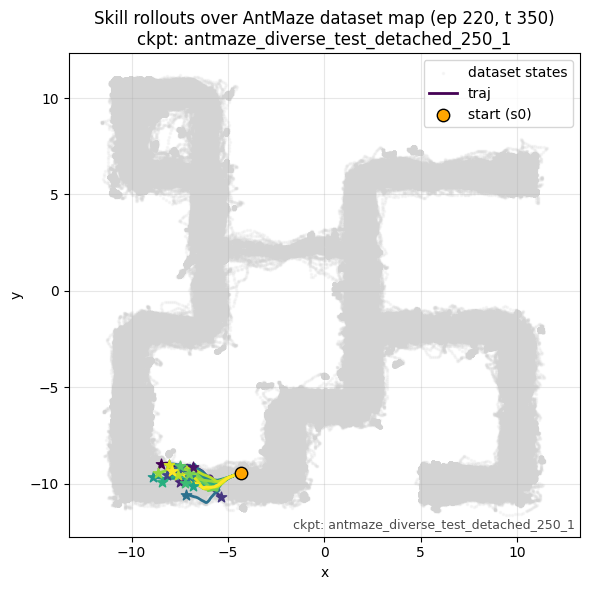

/var/folders/wp/q7yyy4ls2m3bvyscgh359t0r0000gn/T/ipykernel_62356/3168814382.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("viridis", len(trajs_xy))
/var/folders/wp/q7yyy4ls2m3bvyscgh359t0r0000gn/T/ipykernel_62356/3168814382.py:91: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="best")


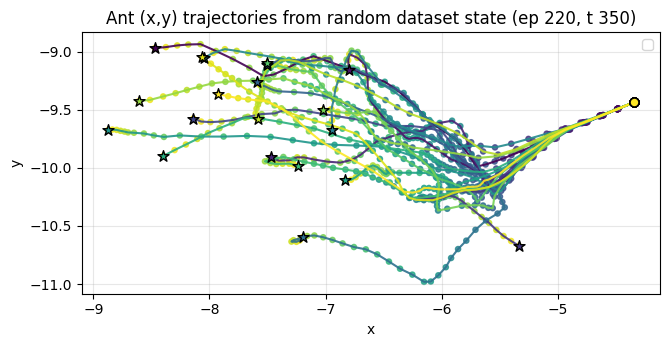

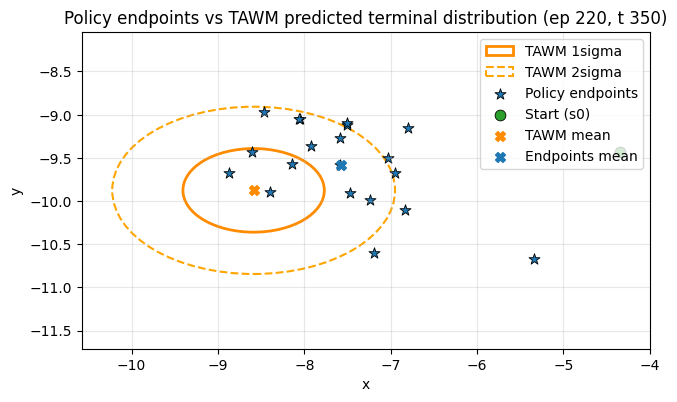

Plotting for episode 7, timestep 599 


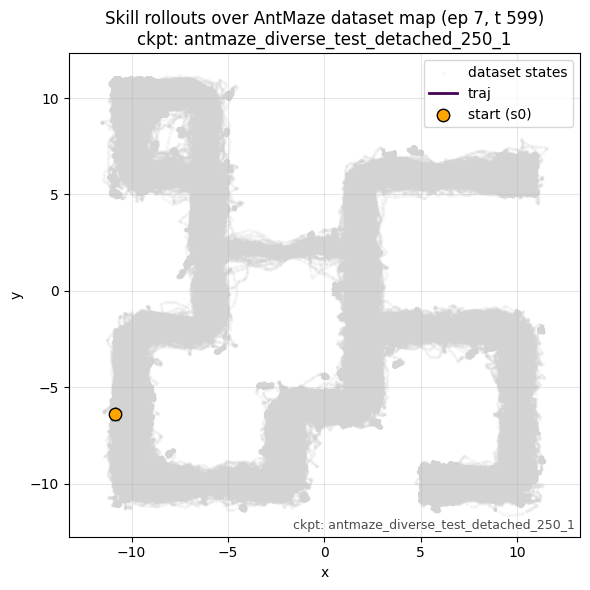

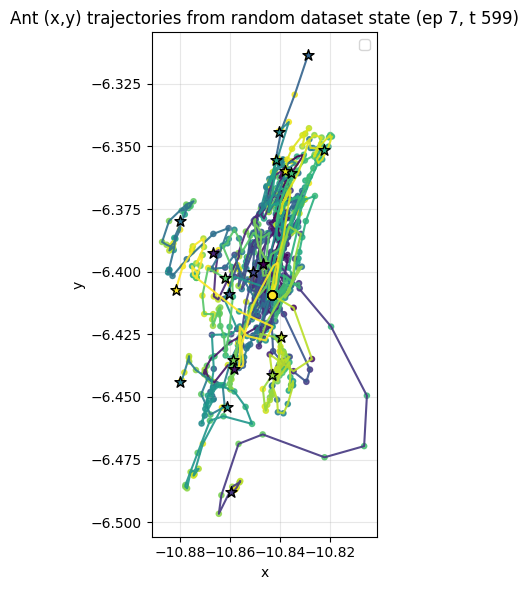

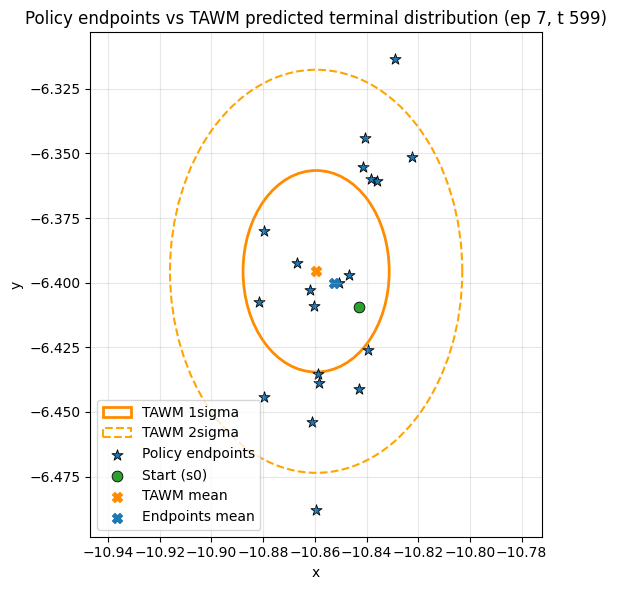

Plotting for episode 739, timestep 157 


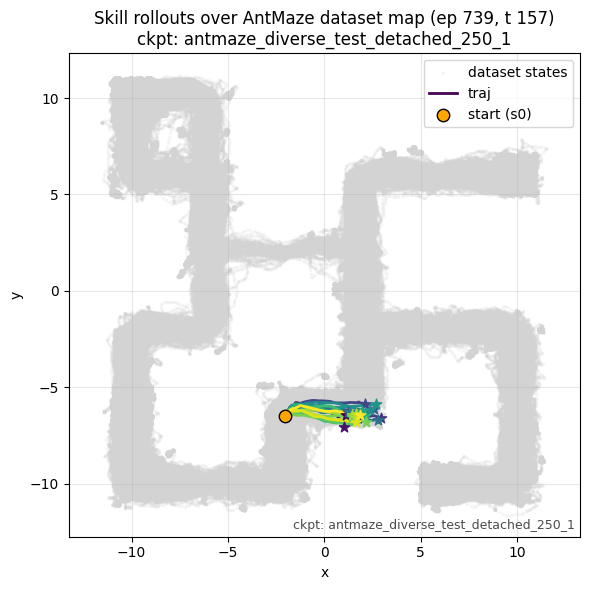

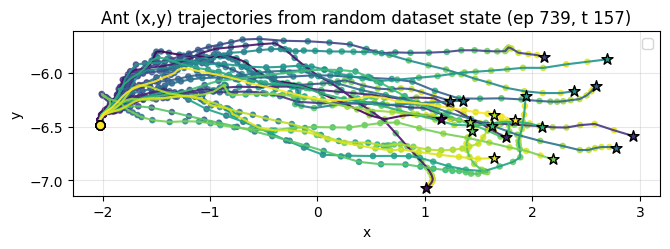

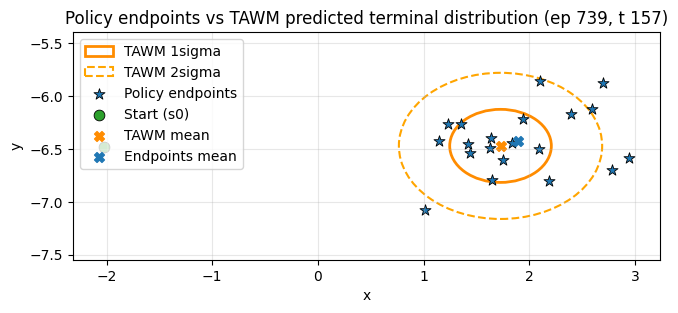

Plotting for episode 889, timestep 866 


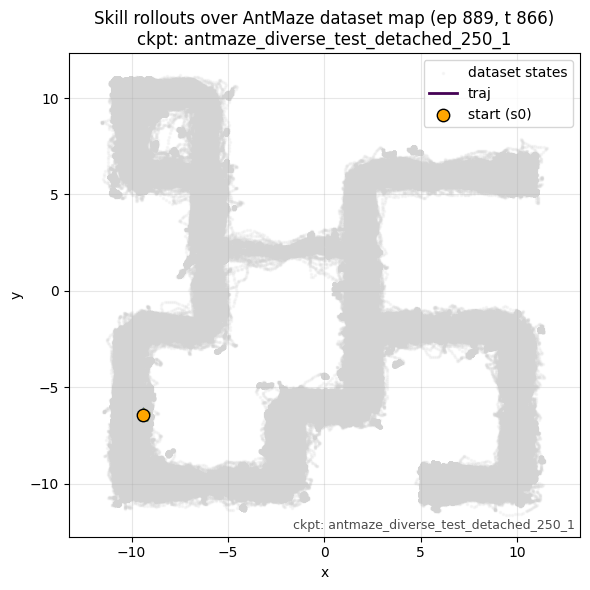

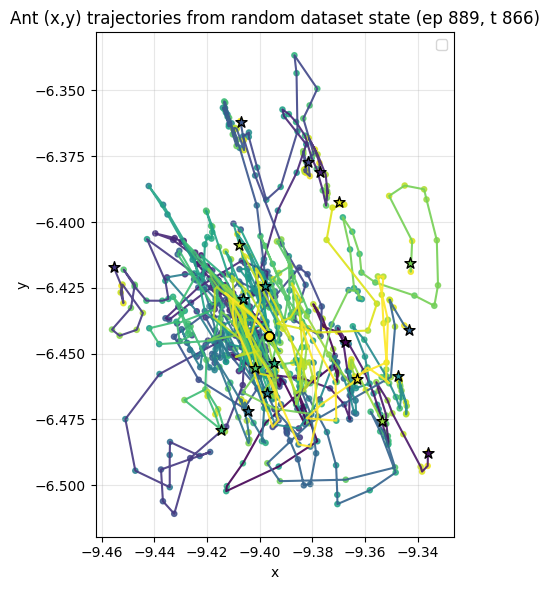

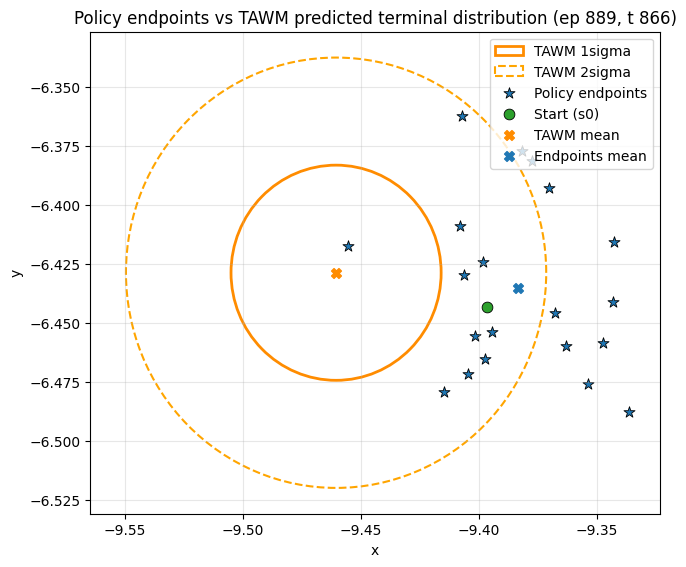

Plotting for episode 451, timestep 375 


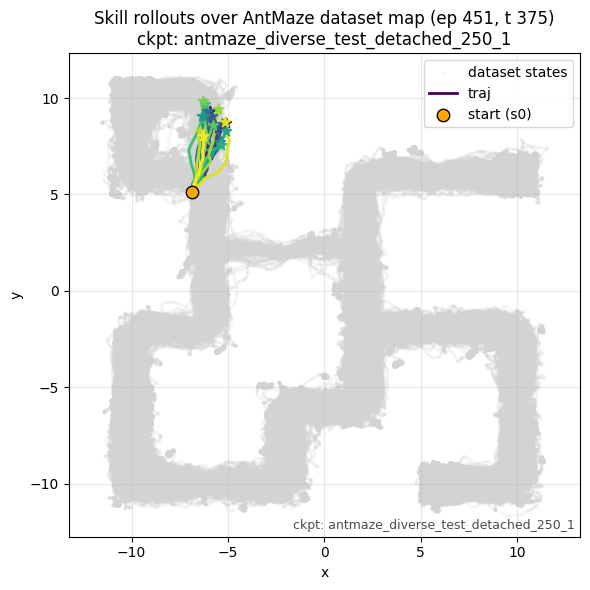

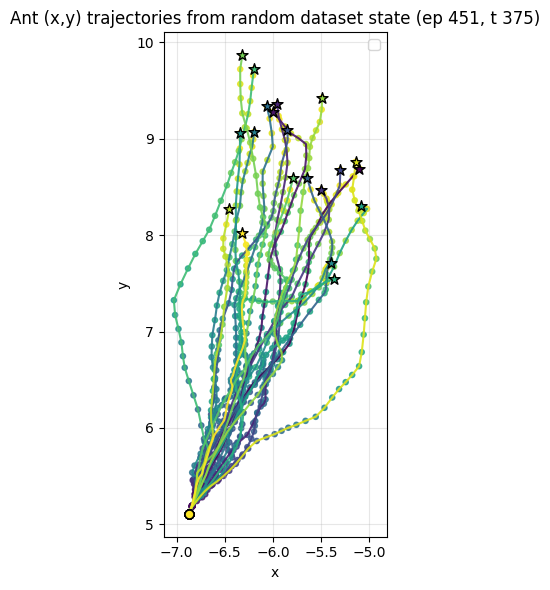

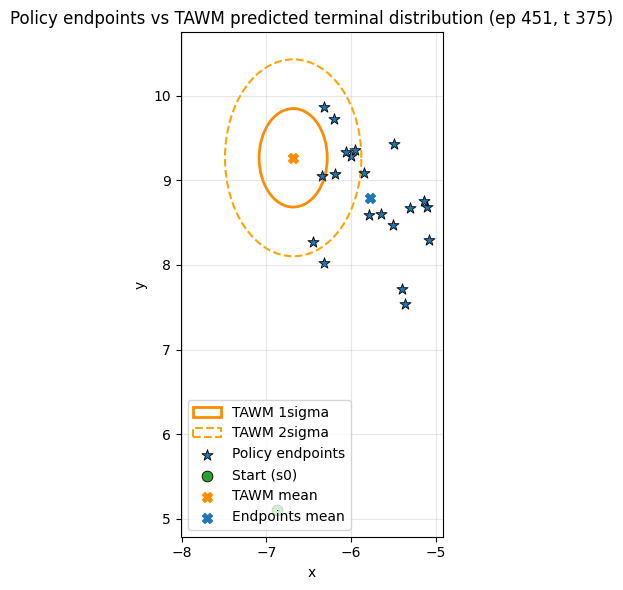

Plotting for episode 909, timestep 46 


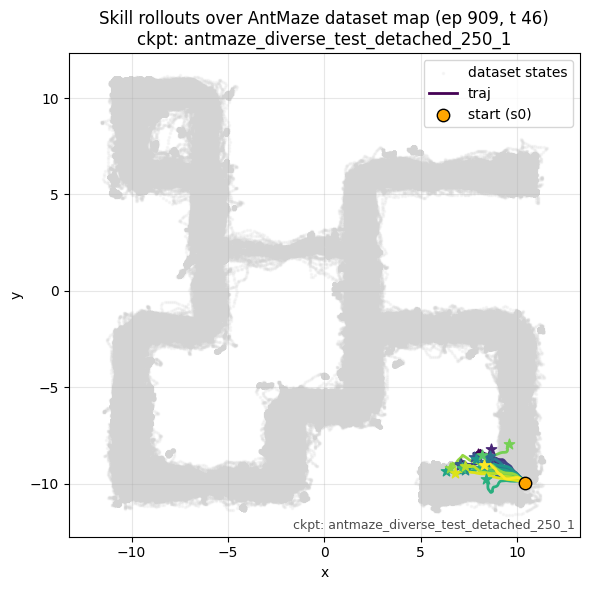

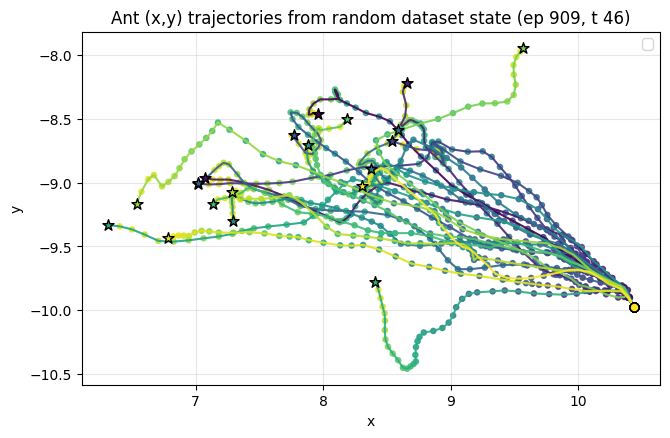

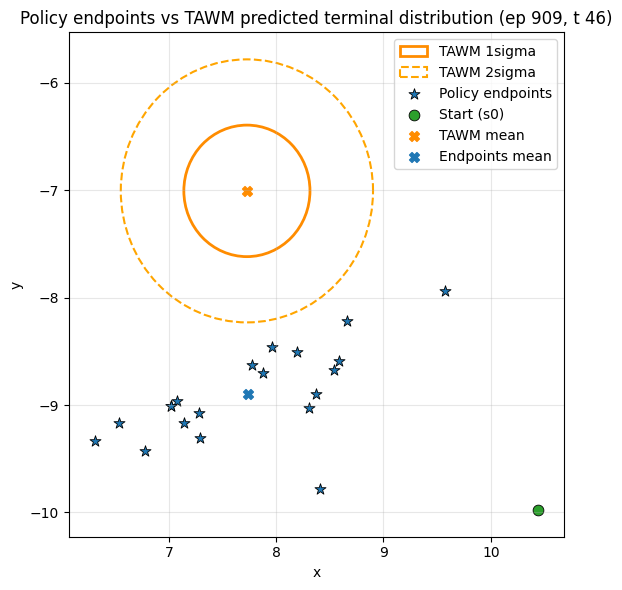

Plotting for episode 415, timestep 780 


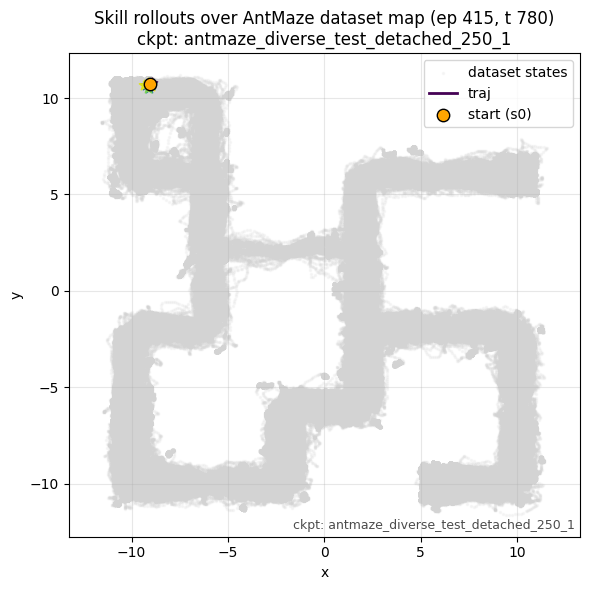

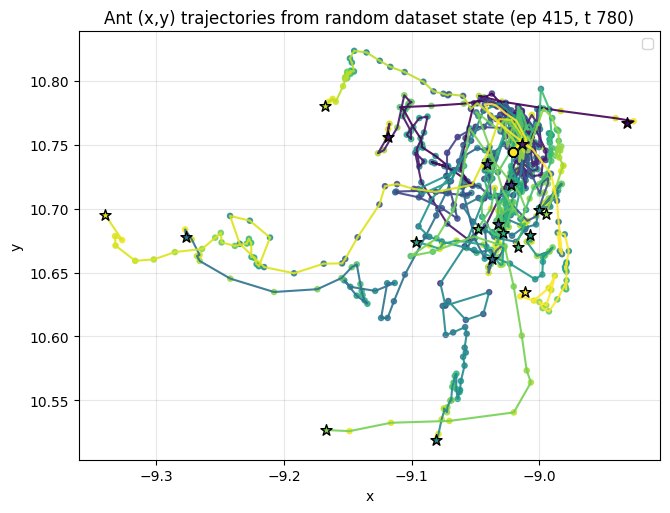

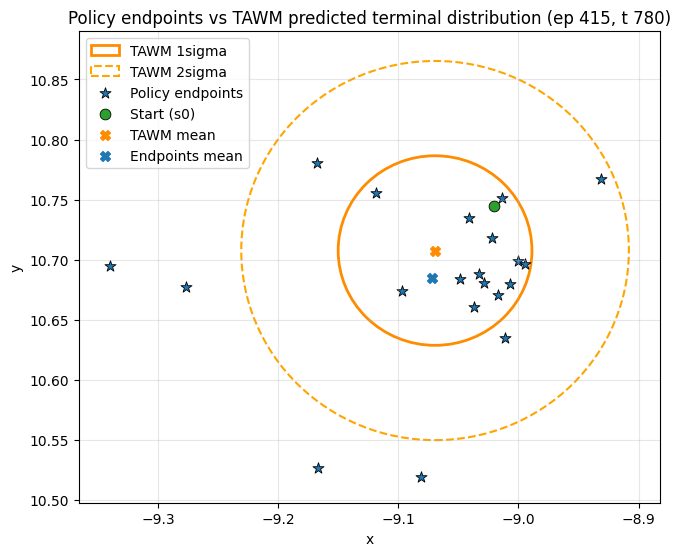

Plotting for episode 741, timestep 452 


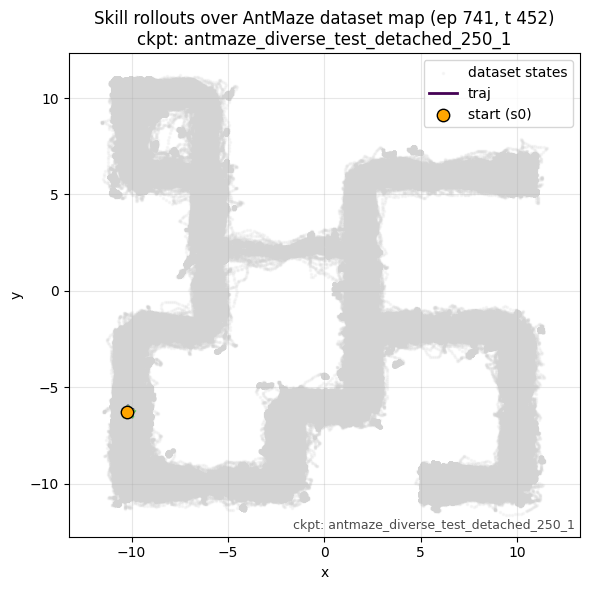

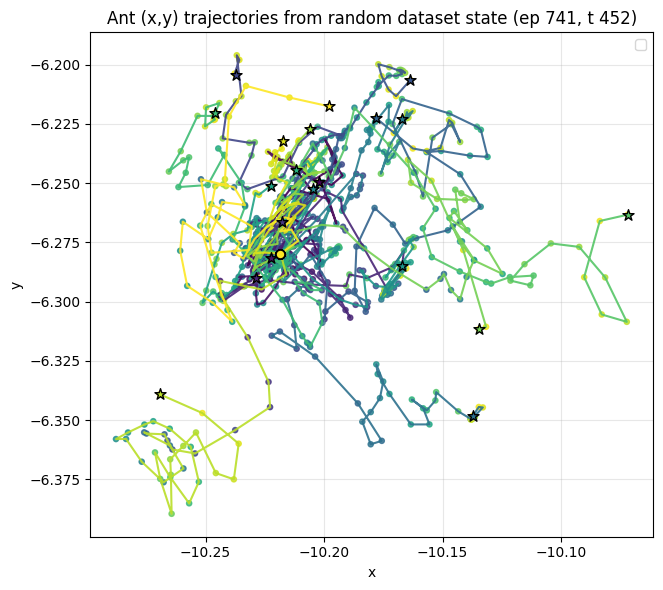

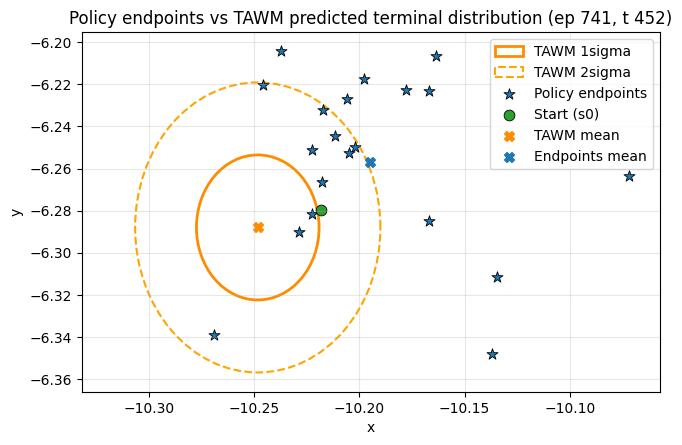

Plotting for episode 592, timestep 920 


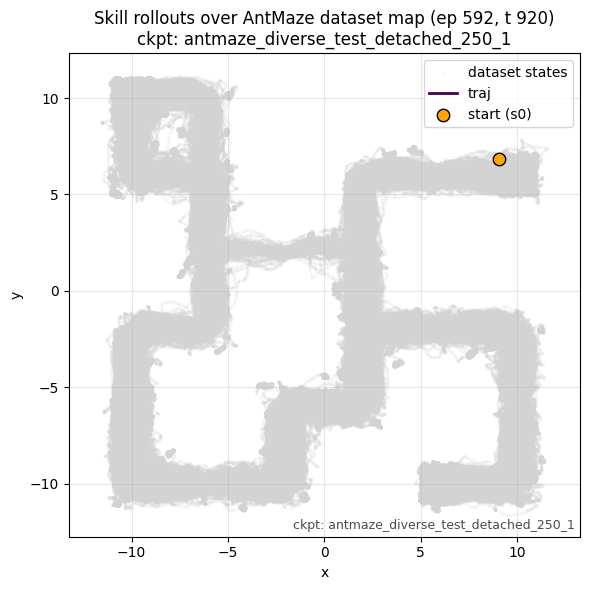

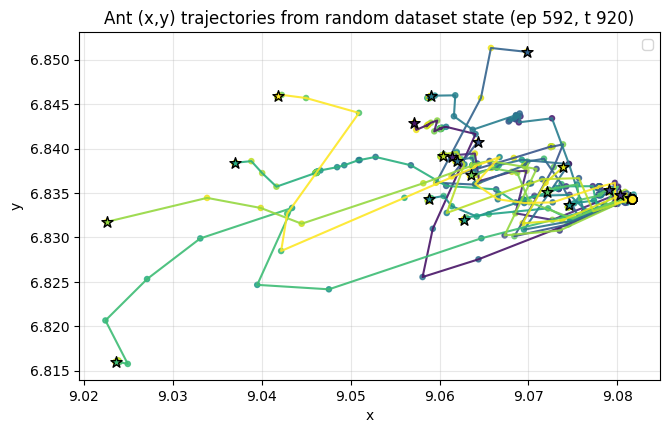

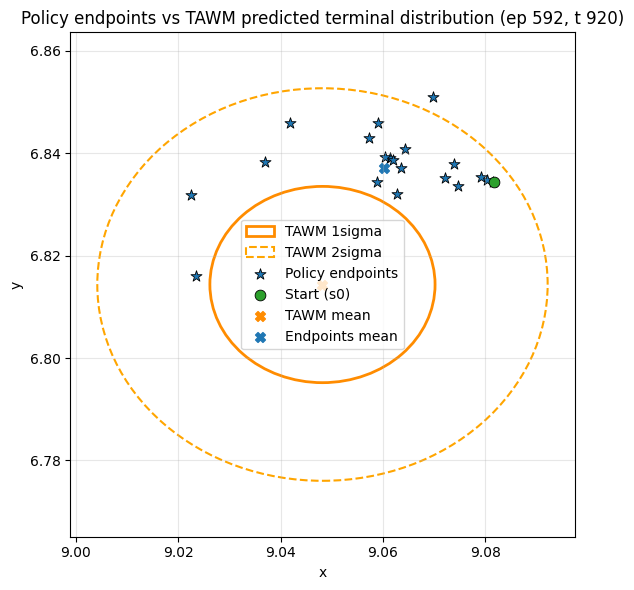

Plotting for episode 819, timestep 729 


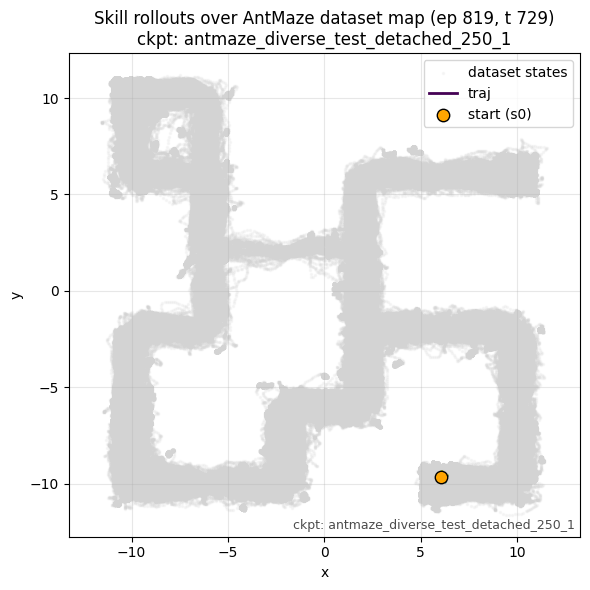

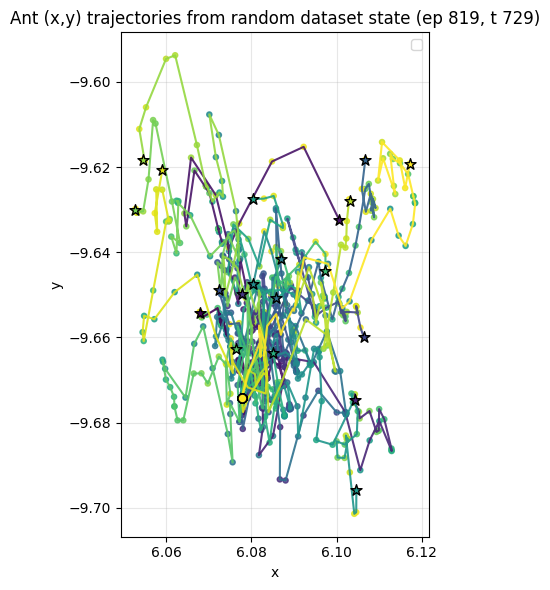

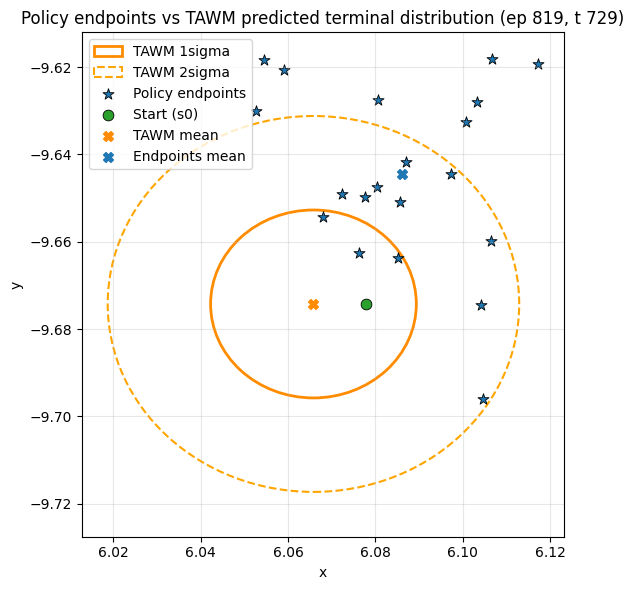

Plotting for episode 184, timestep 338 


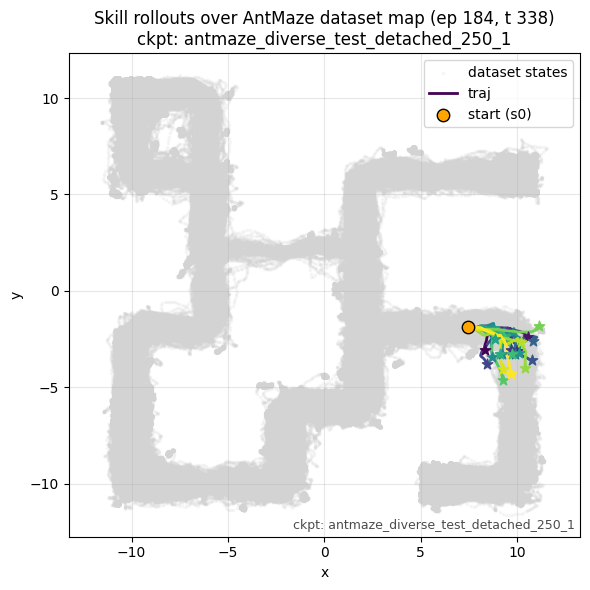

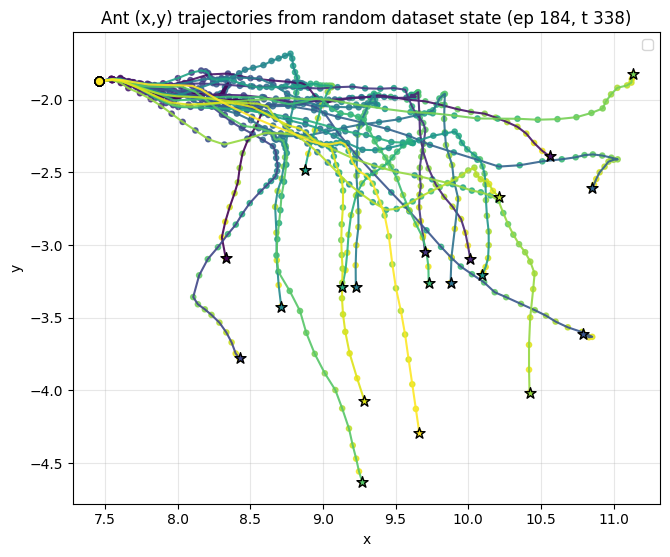

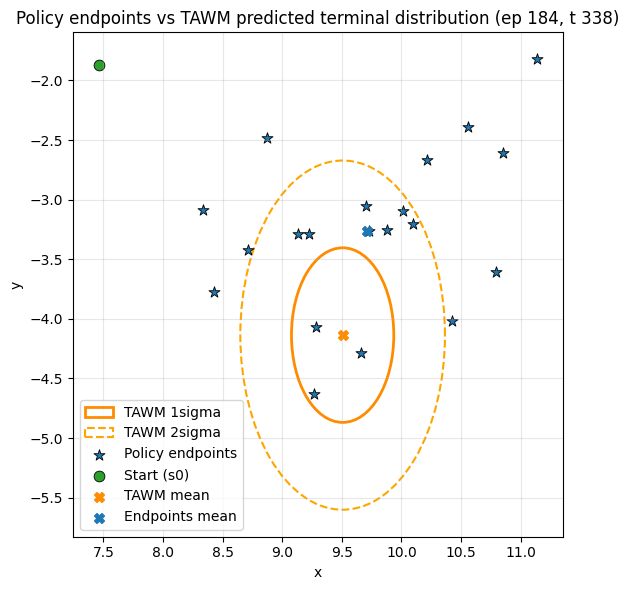

Plotting for episode 244, timestep 802 


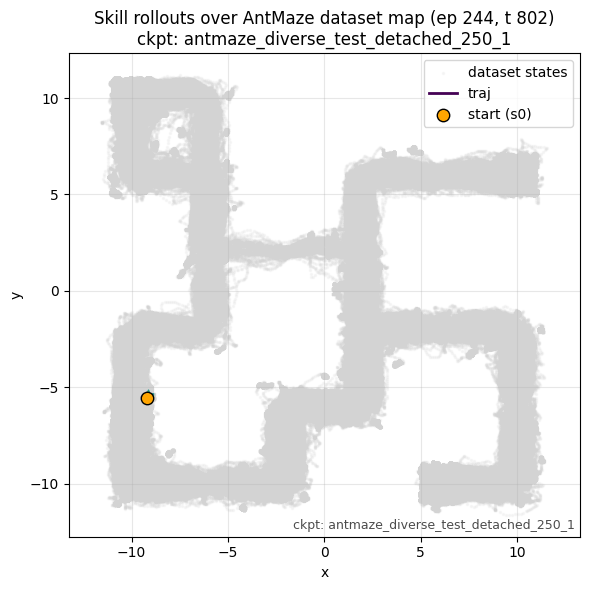

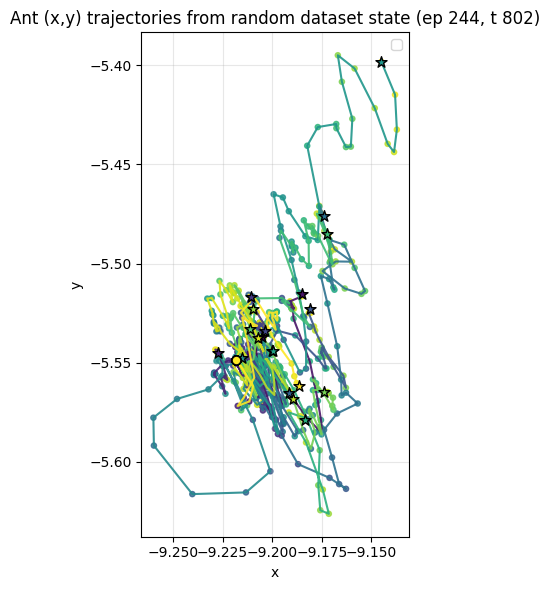

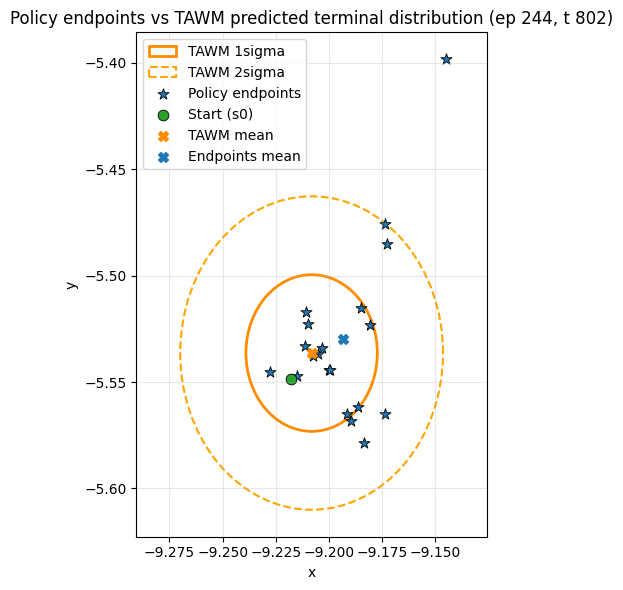

Plotting for episode 923, timestep 312 


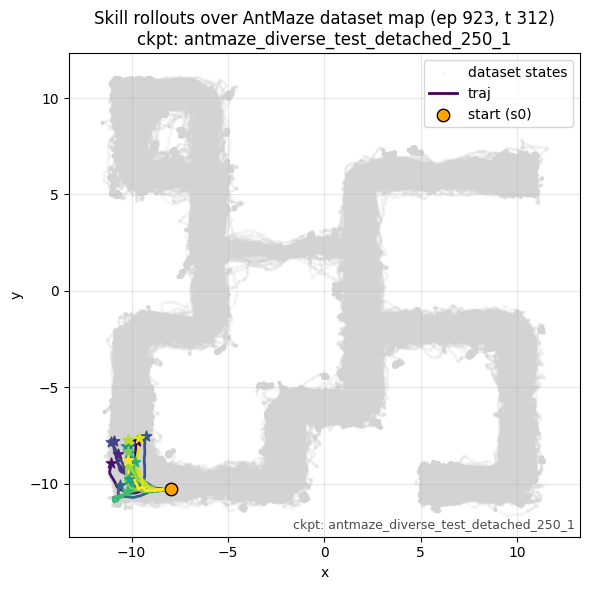

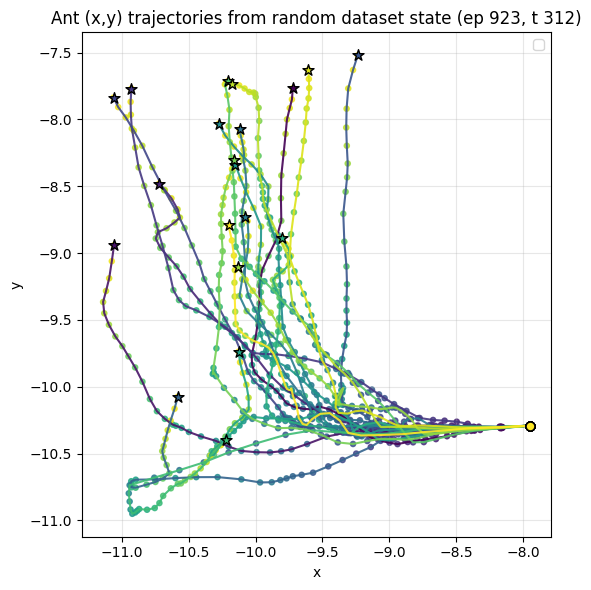

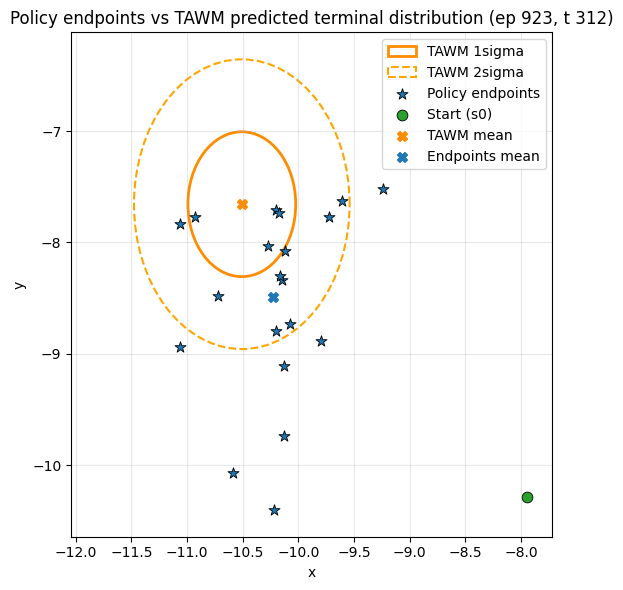

Plotting for episode 213, timestep 40 


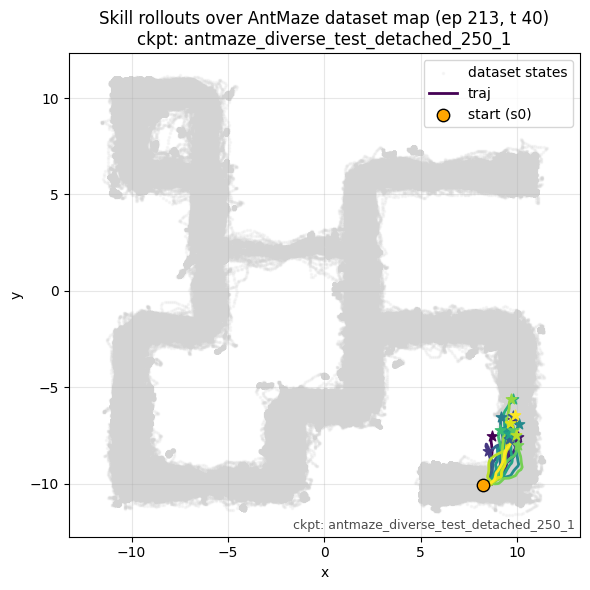

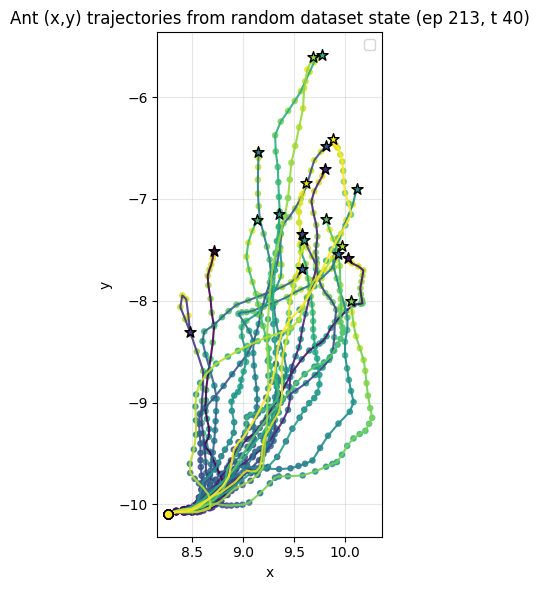

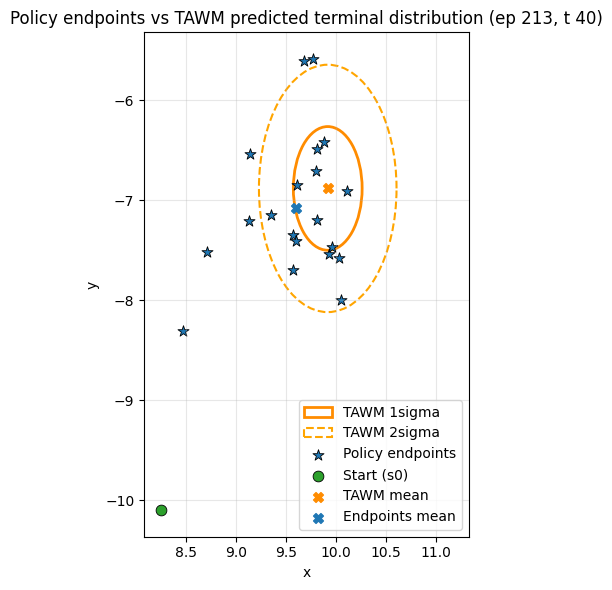

Plotting for episode 497, timestep 787 


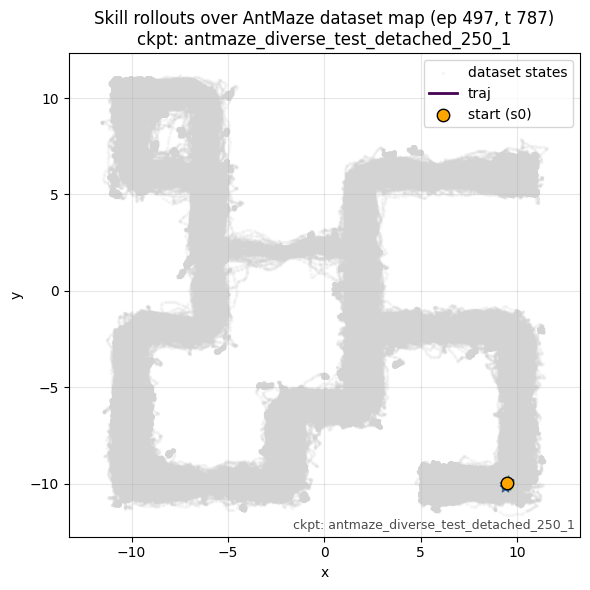

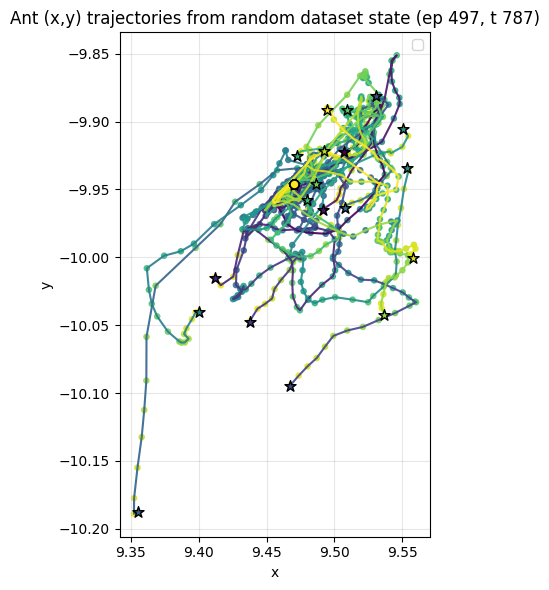

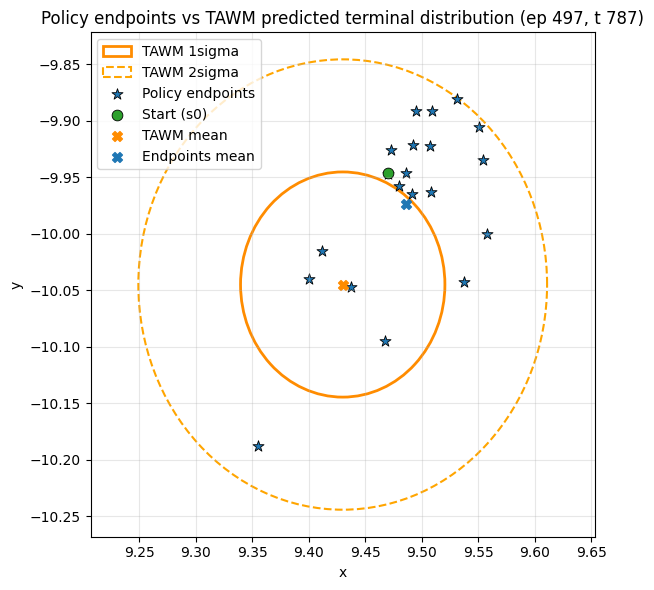

Plotting for episode 449, timestep 450 


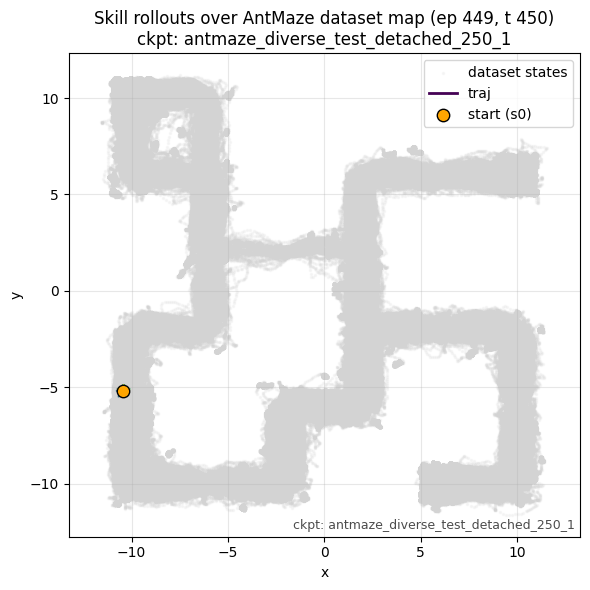

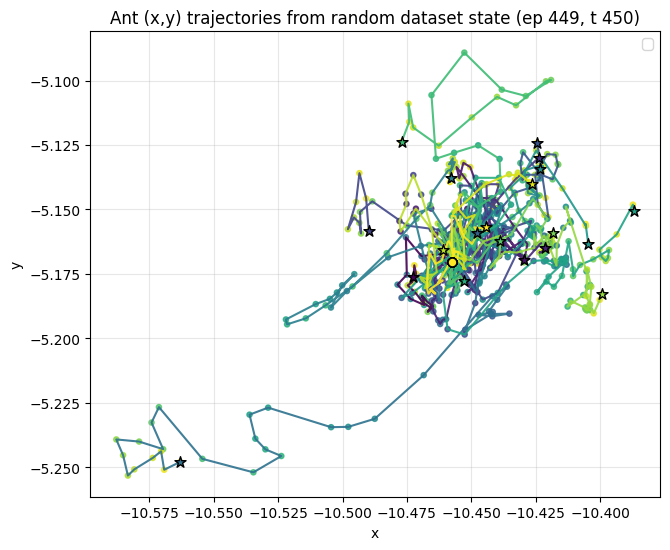

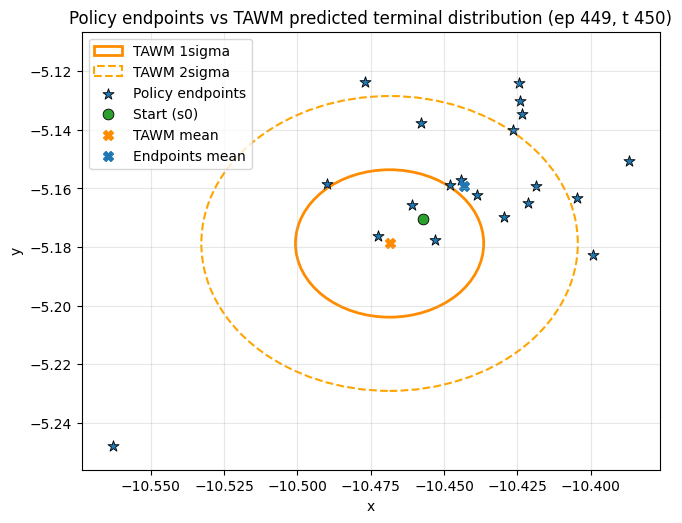

Plotting for episode 175, timestep 899 


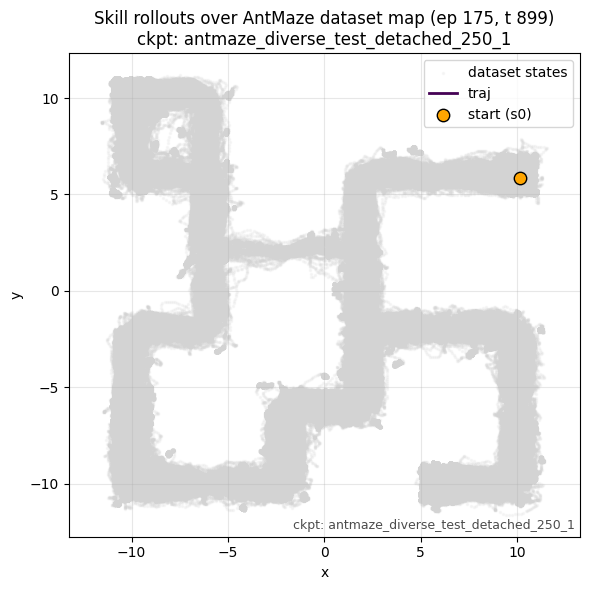

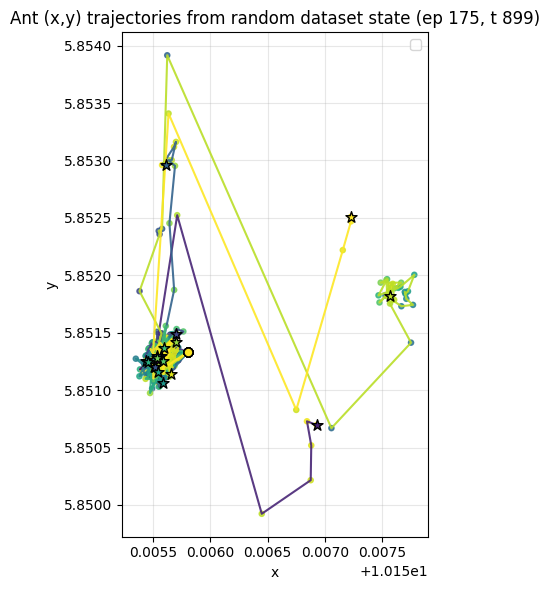

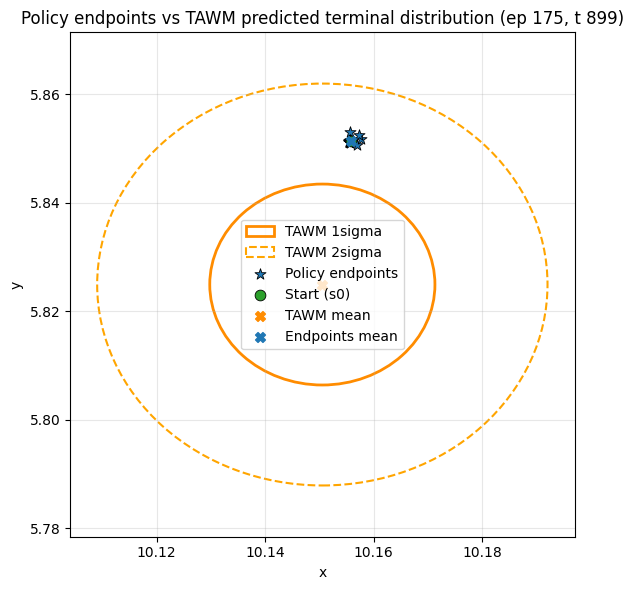

Plotting for episode 799, timestep 115 


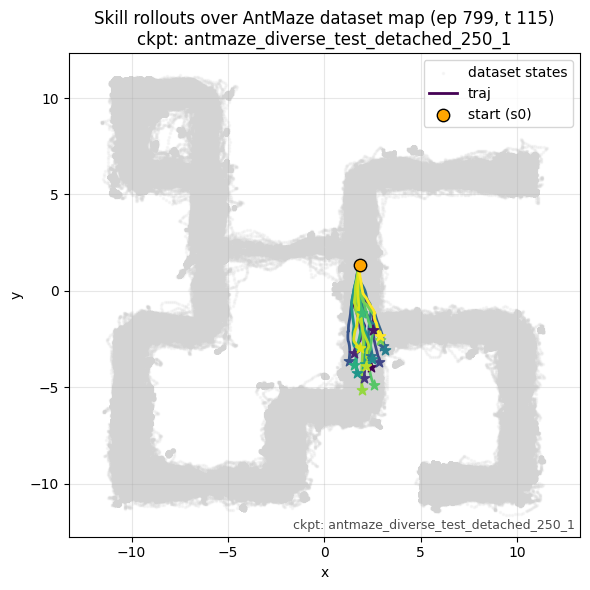

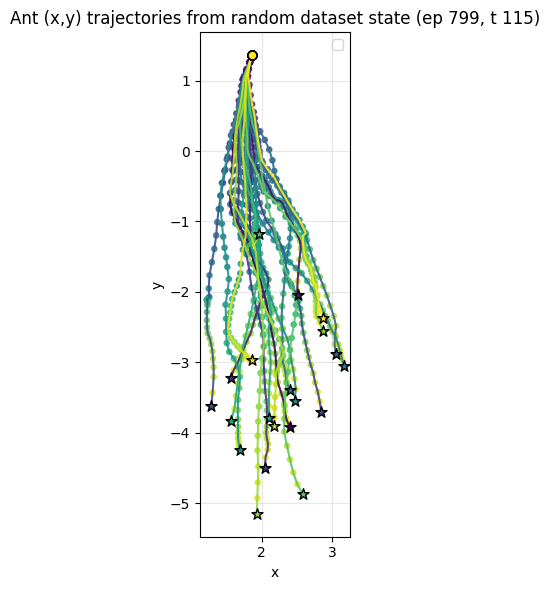

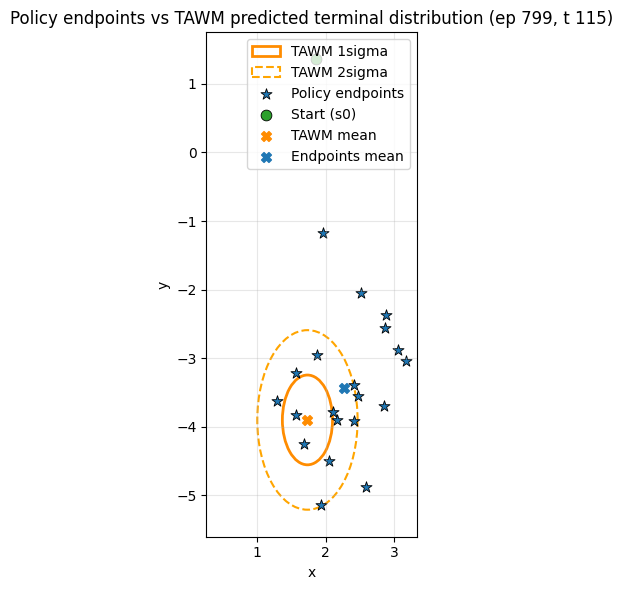

Plotting for episode 682, timestep 319 


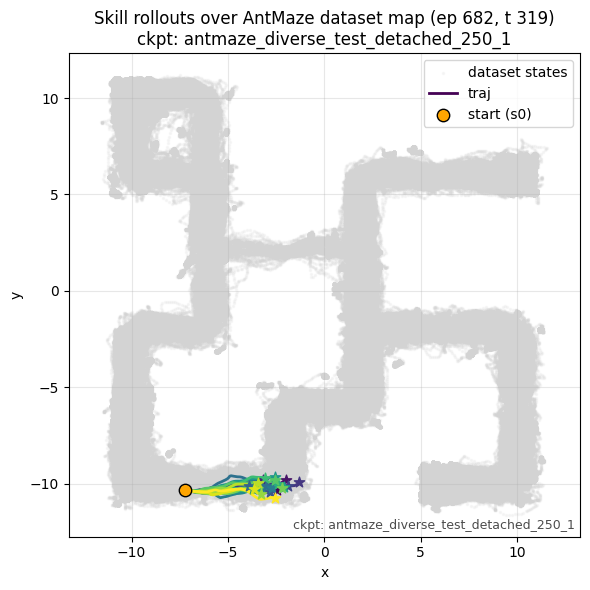

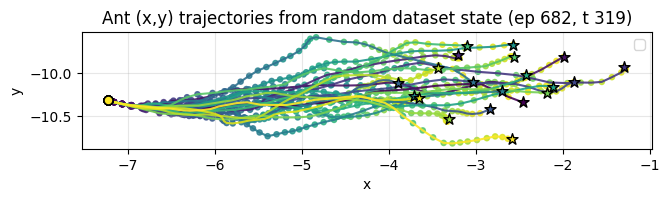

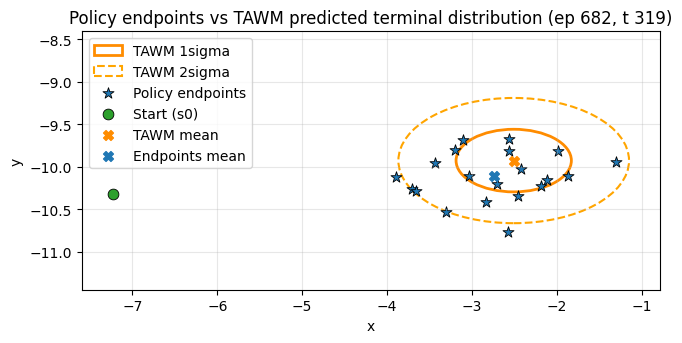

Plotting for episode 347, timestep 789 


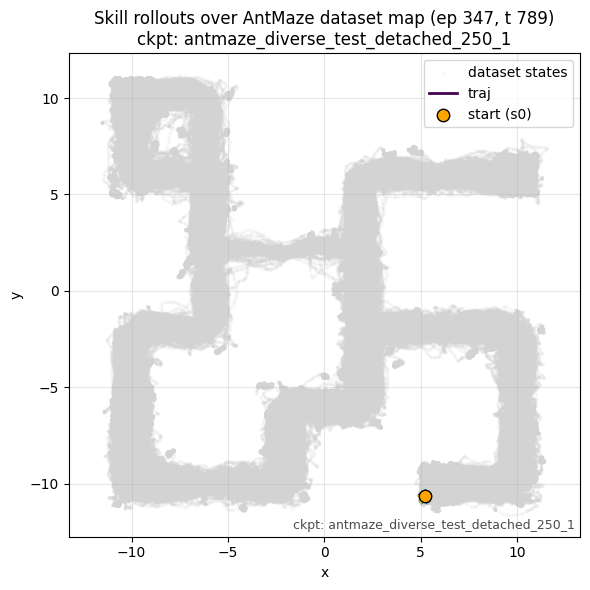

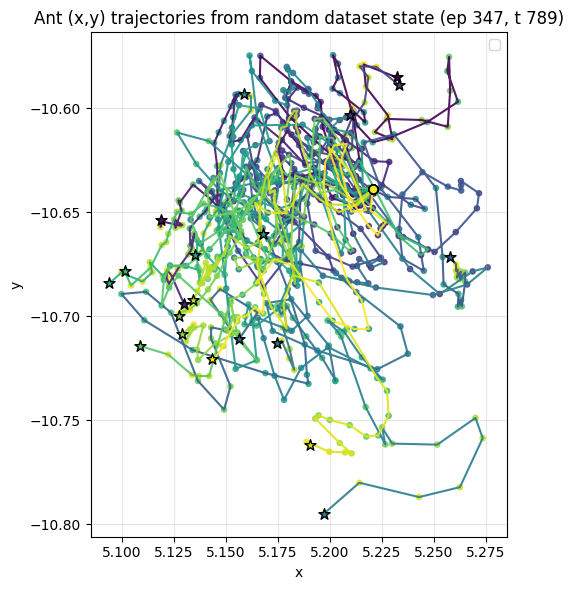

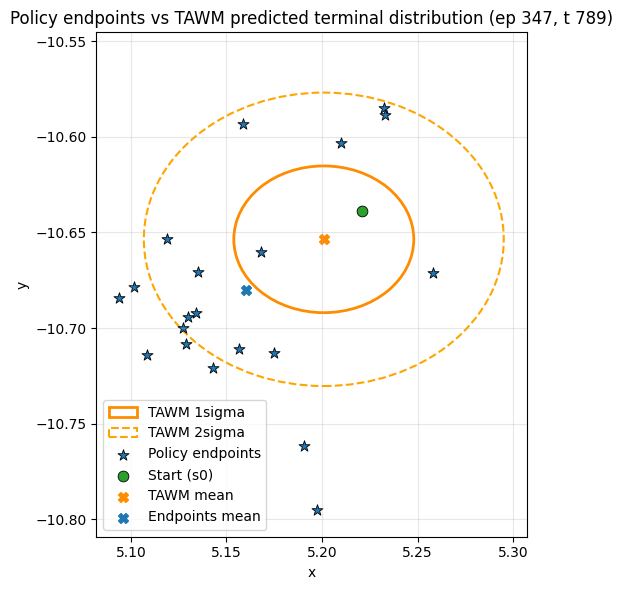

Plotting for episode 241, timestep 217 


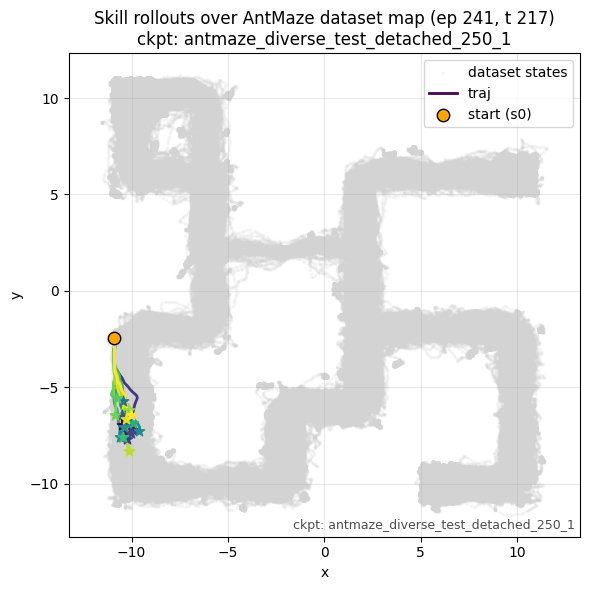

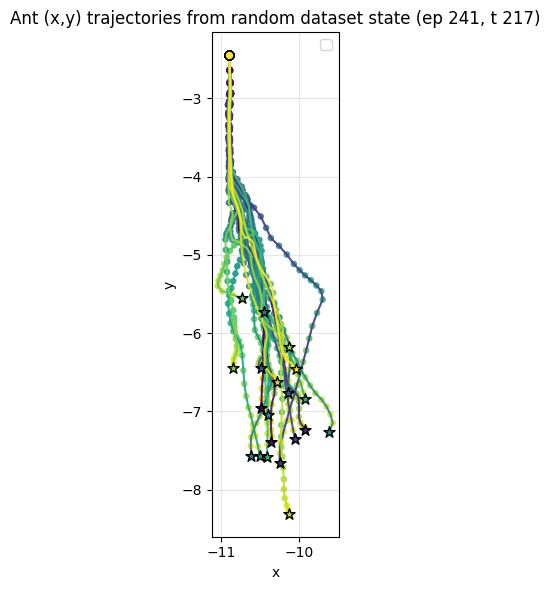

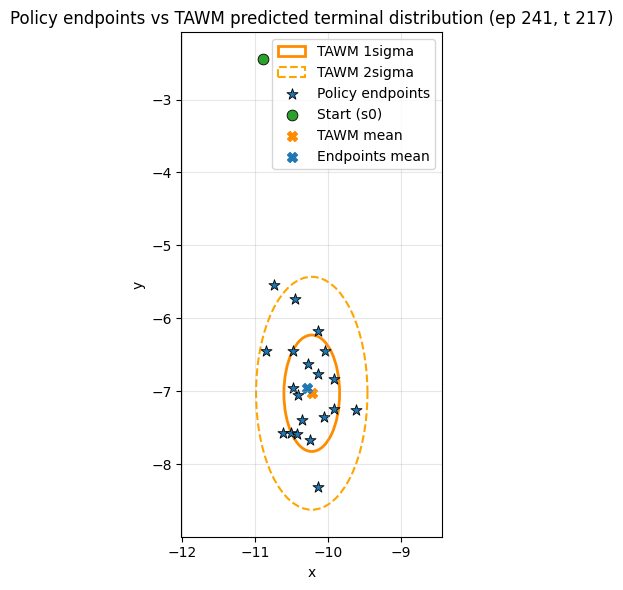

Plotting for episode 794, timestep 144 


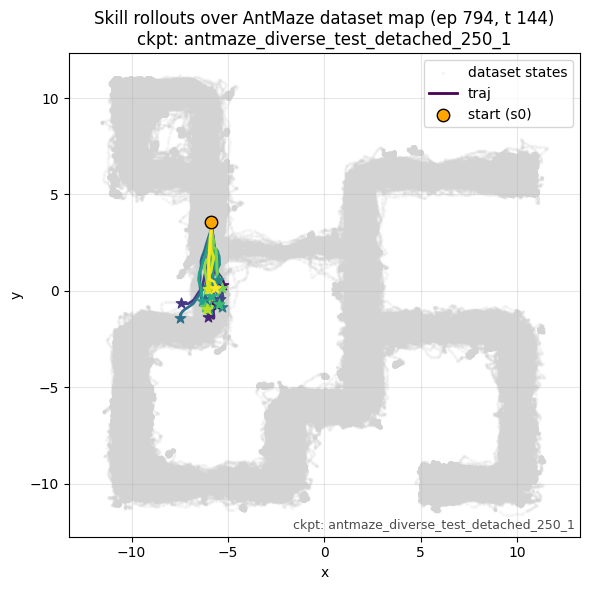

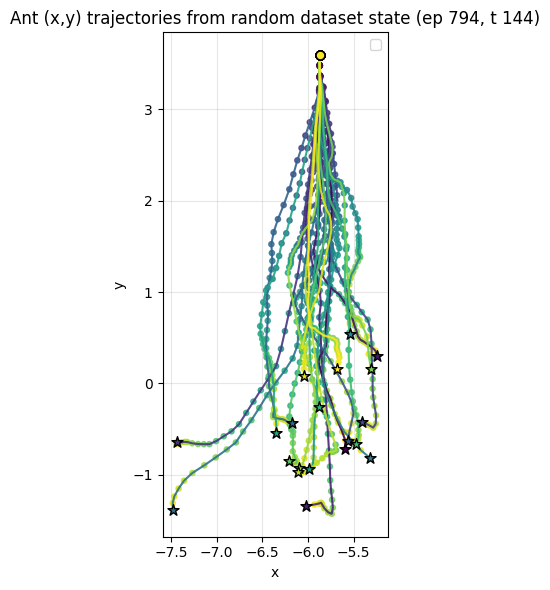

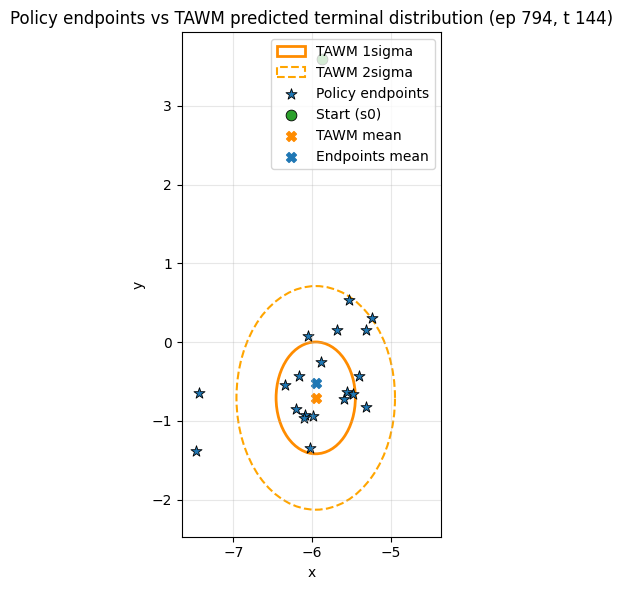

Plotting for episode 835, timestep 38 


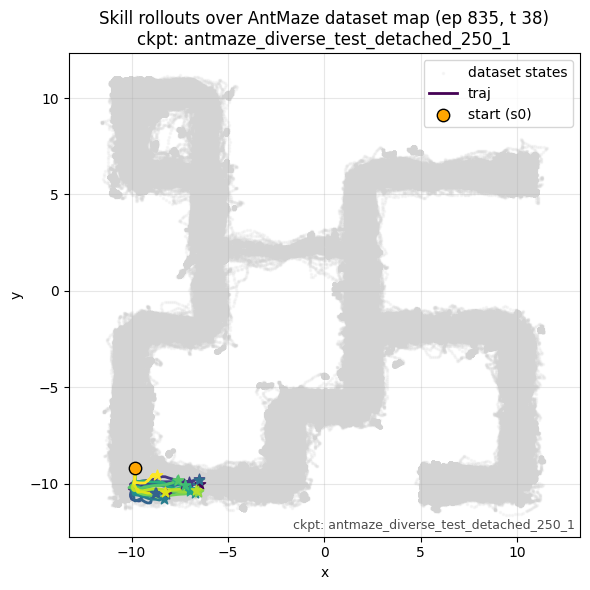

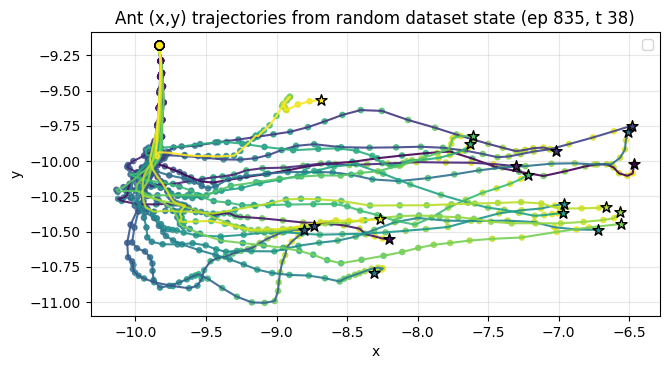

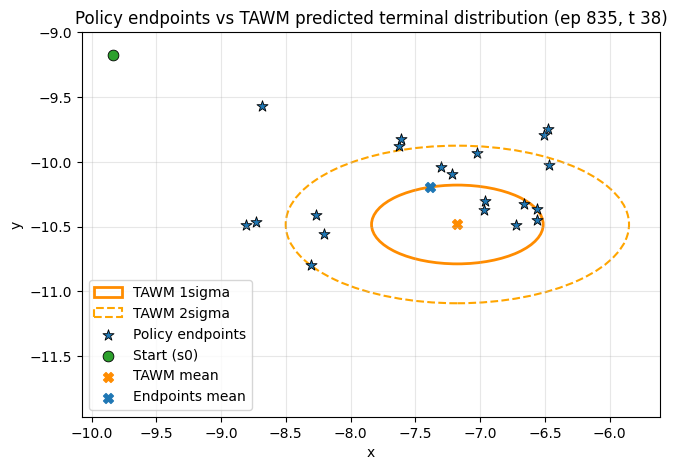

Plotting for episode 148, timestep 225 


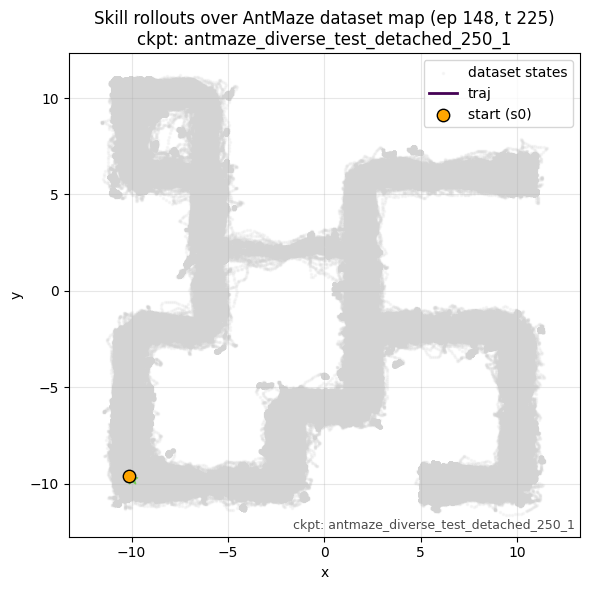

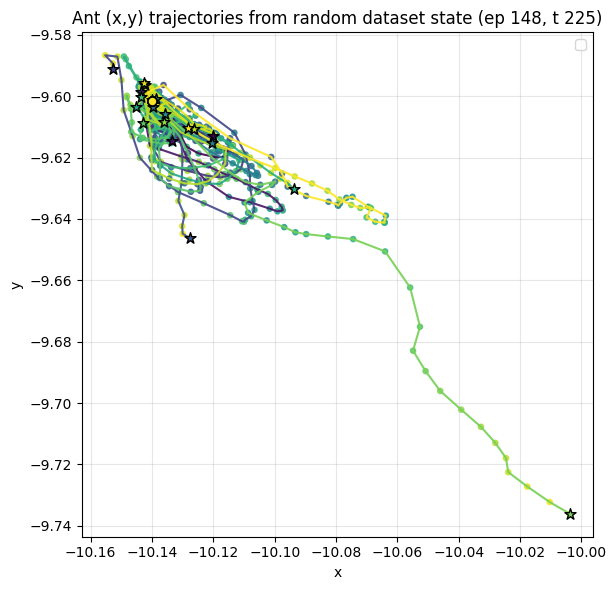

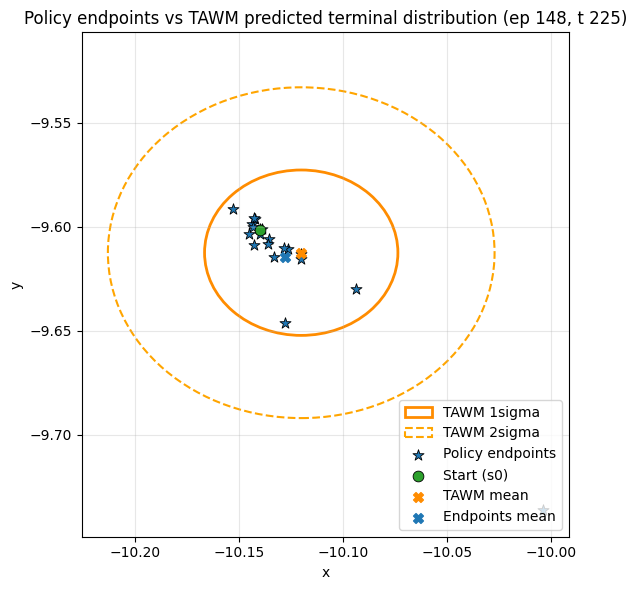

Plotting for episode 792, timestep 63 


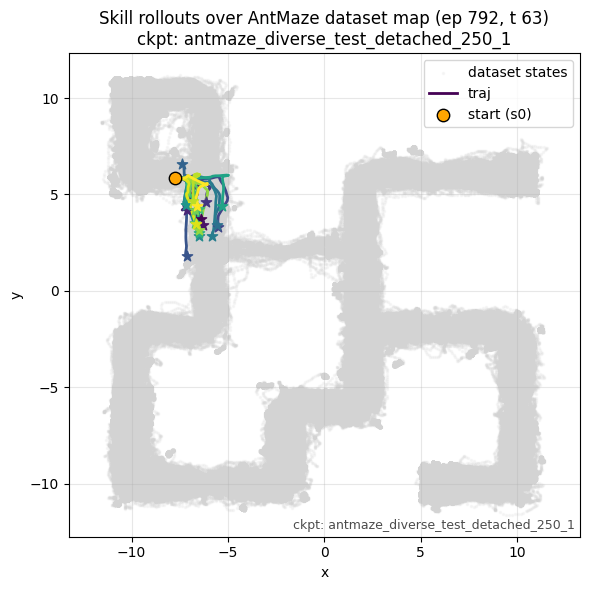

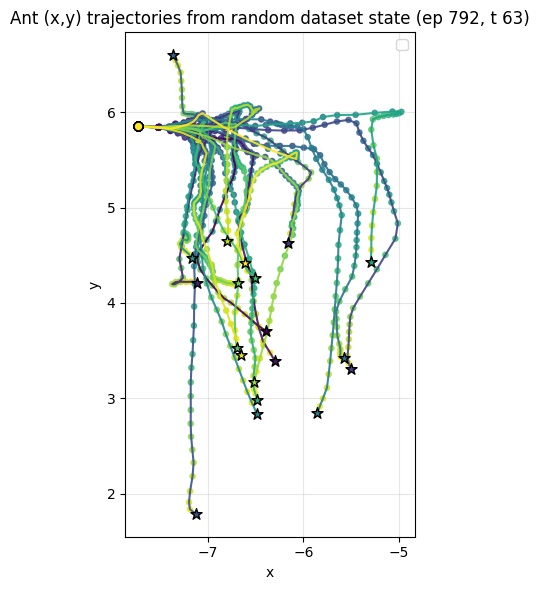

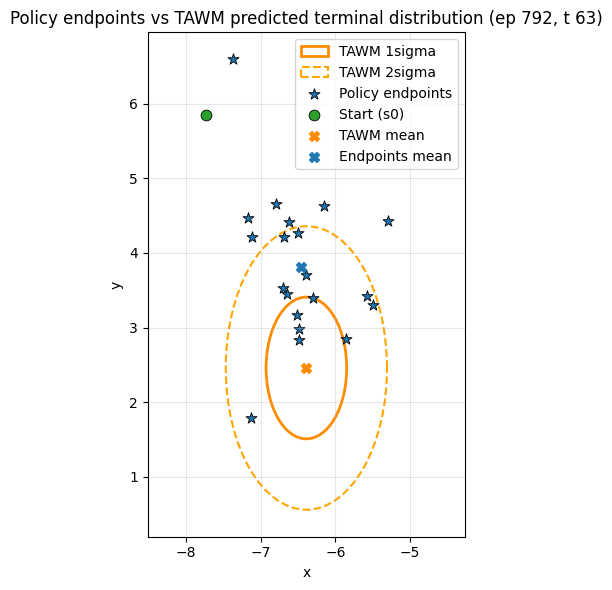

Plotting for episode 213, timestep 759 


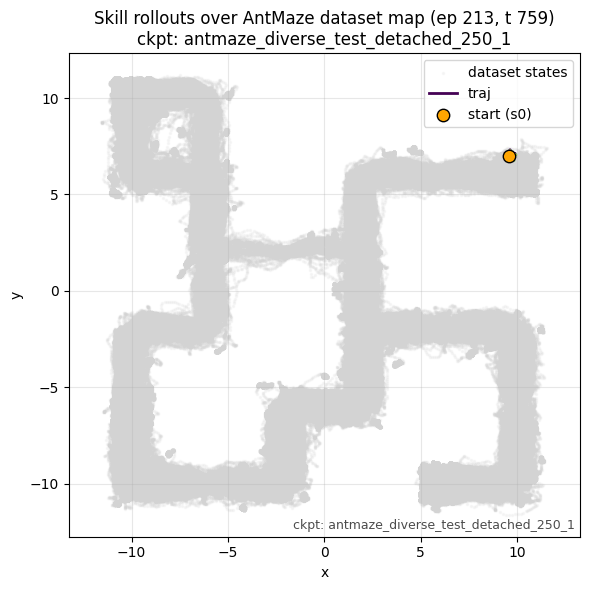

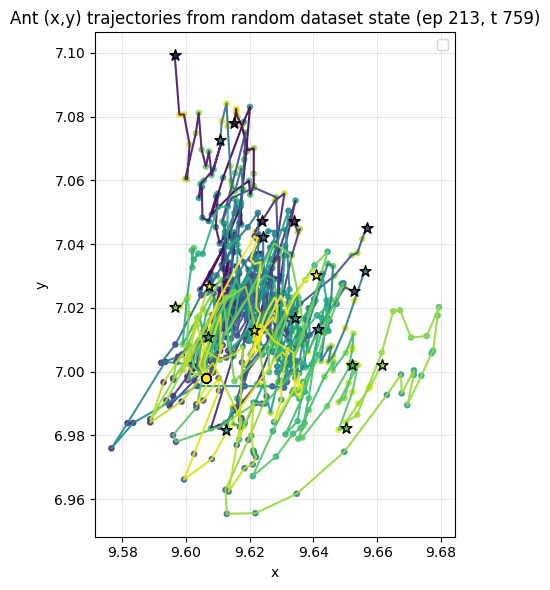

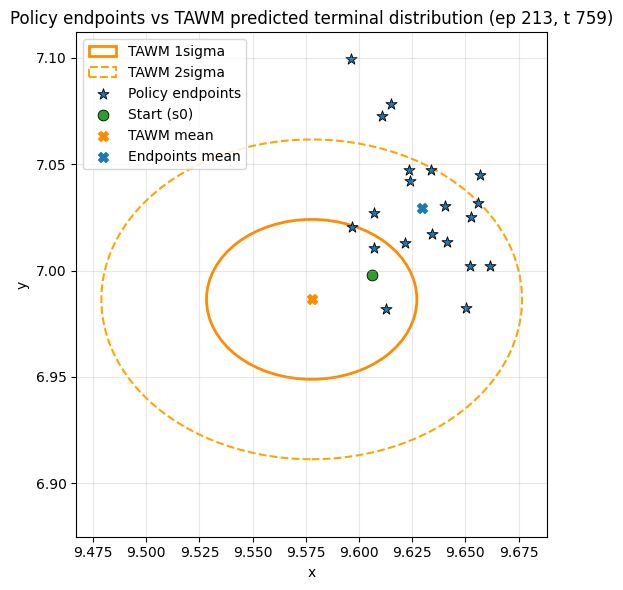

Plotting for episode 512, timestep 957 


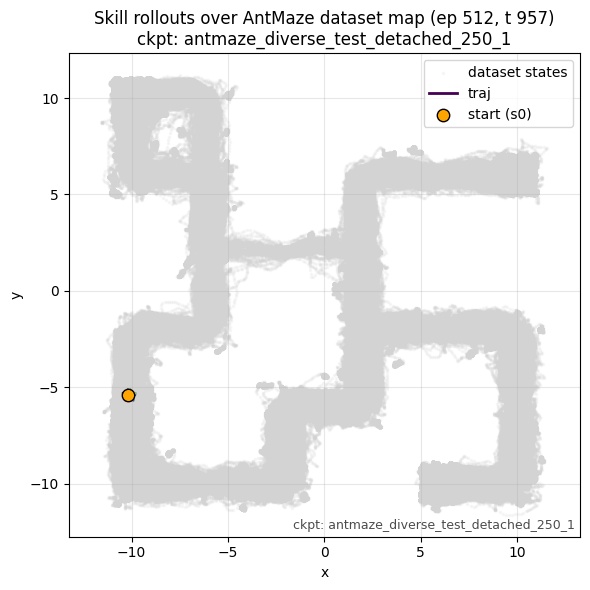

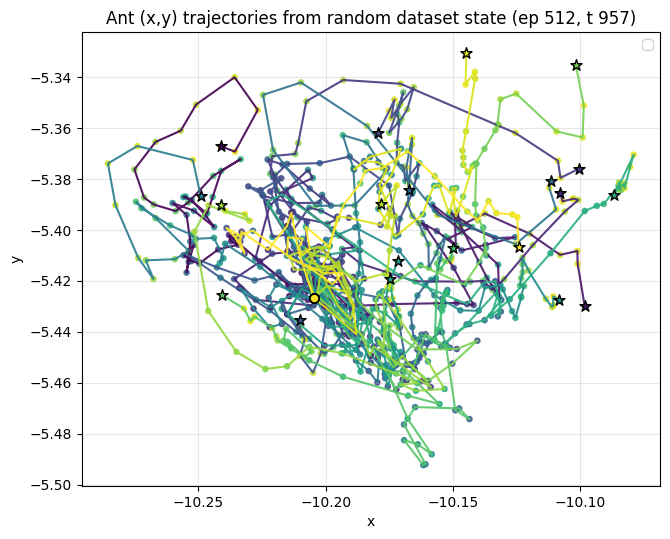

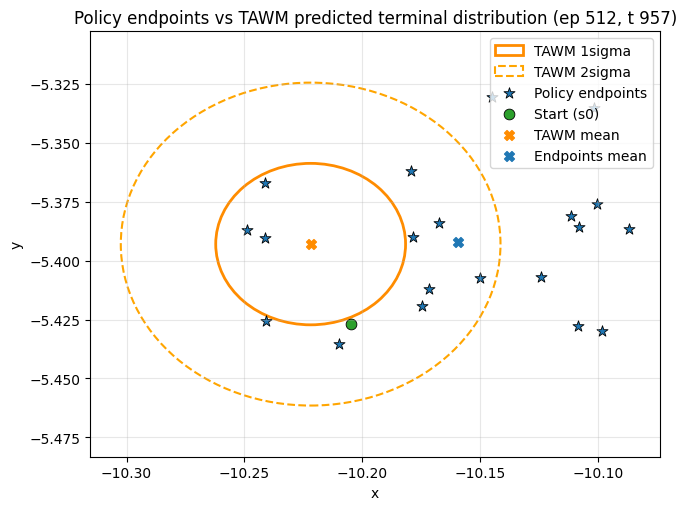

Plotting for episode 165, timestep 903 


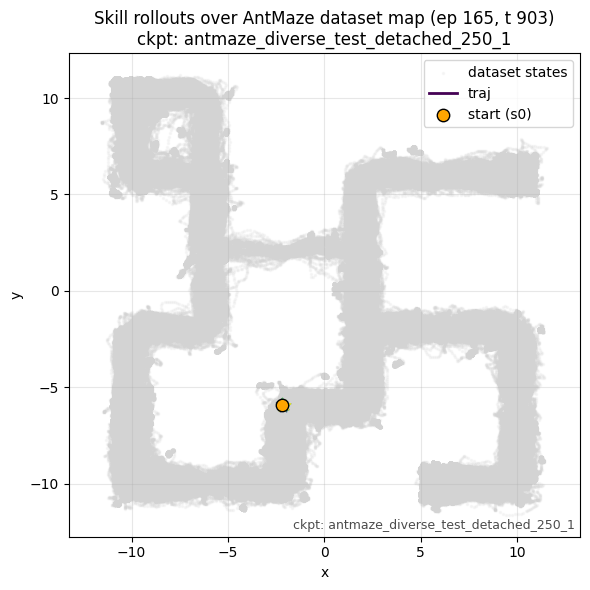

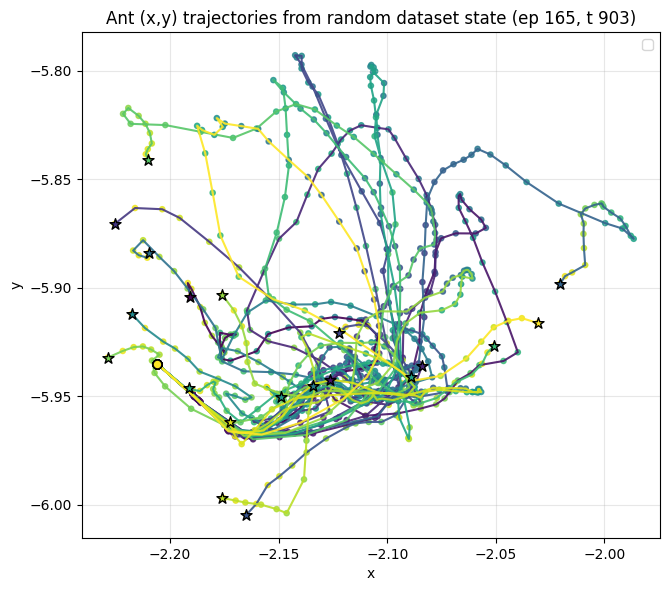

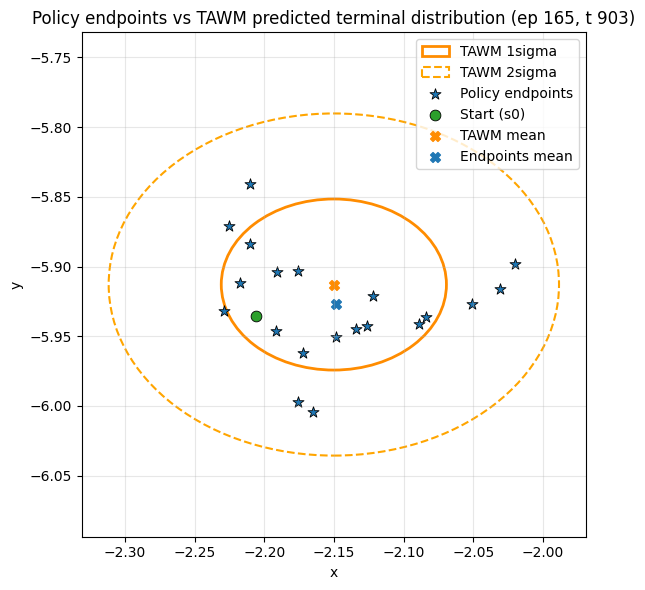

Plotting for episode 333, timestep 603 


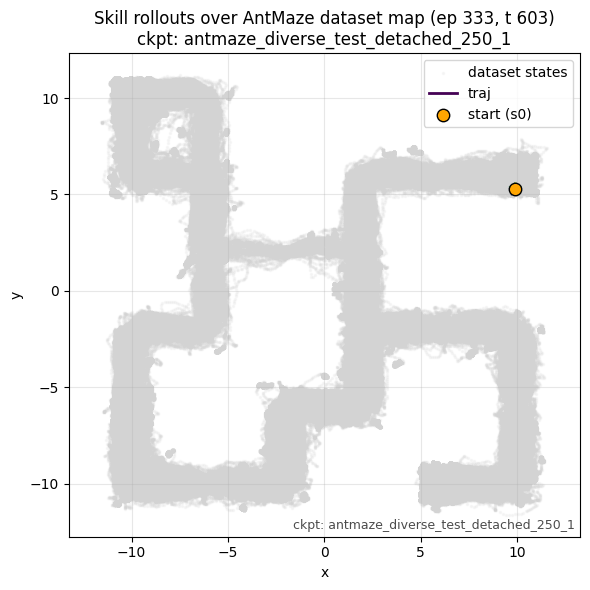

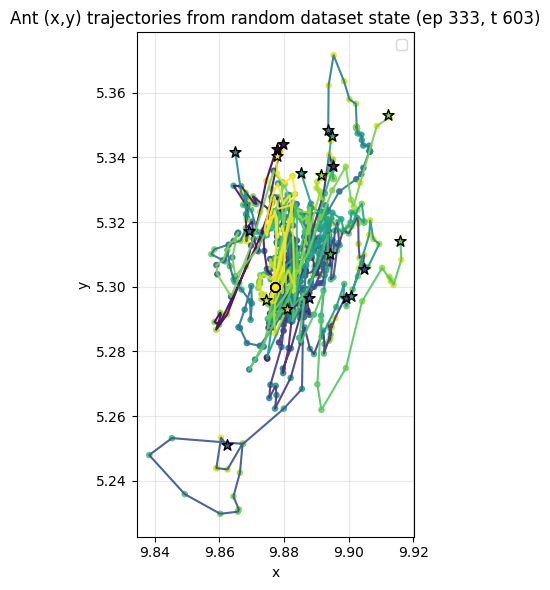

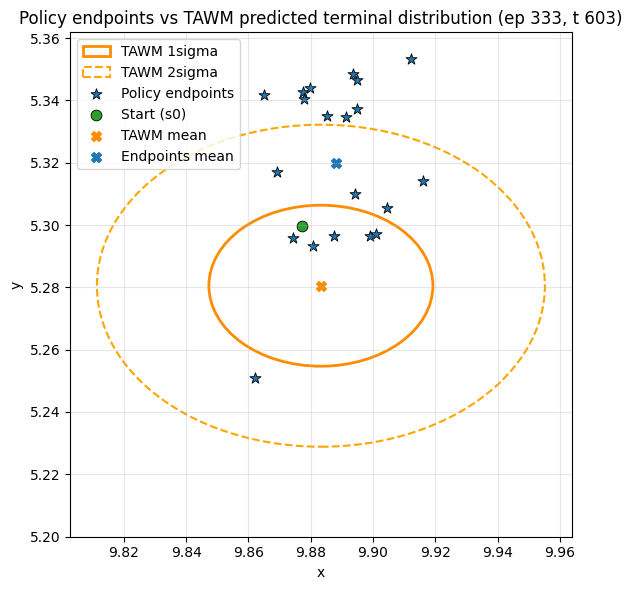

Plotting for episode 276, timestep 565 


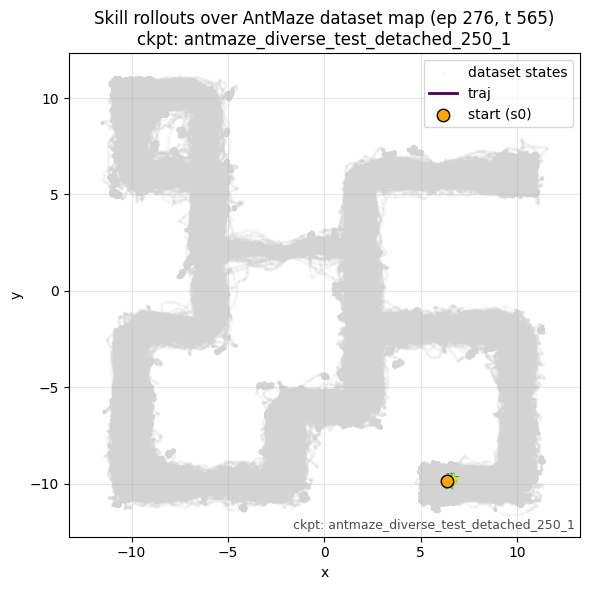

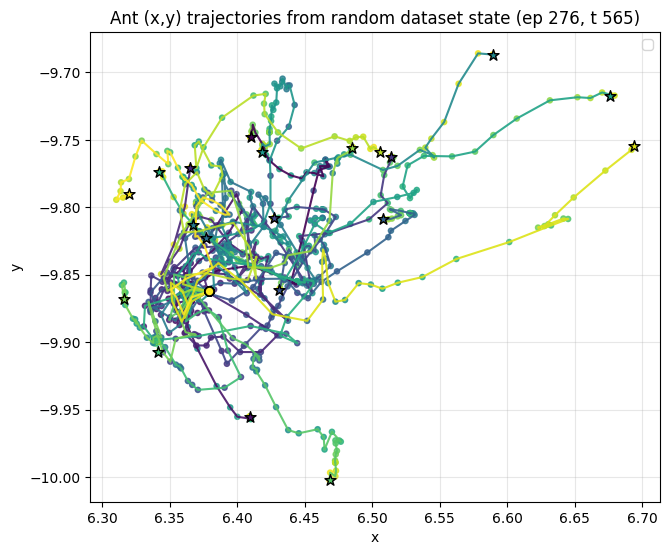

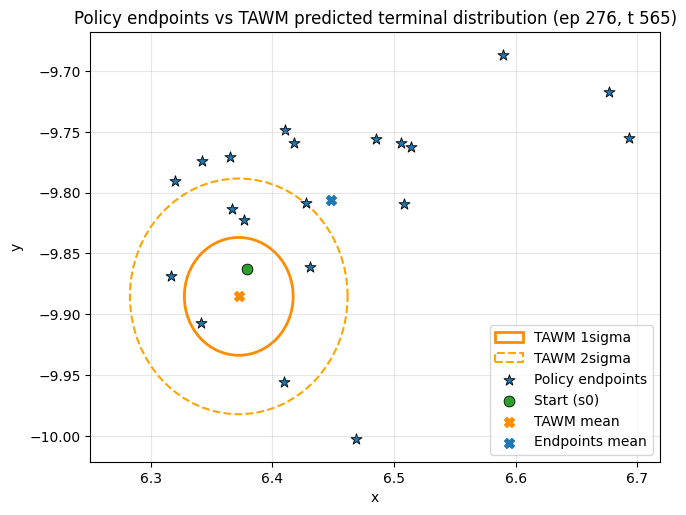

Plotting for episode 16, timestep 152 


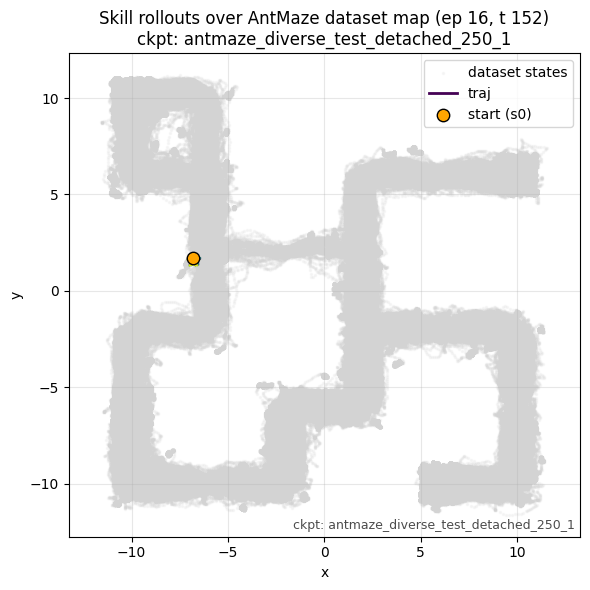

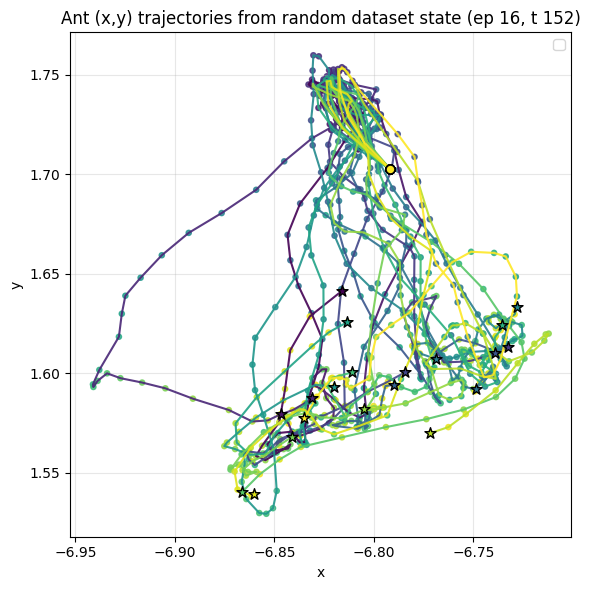

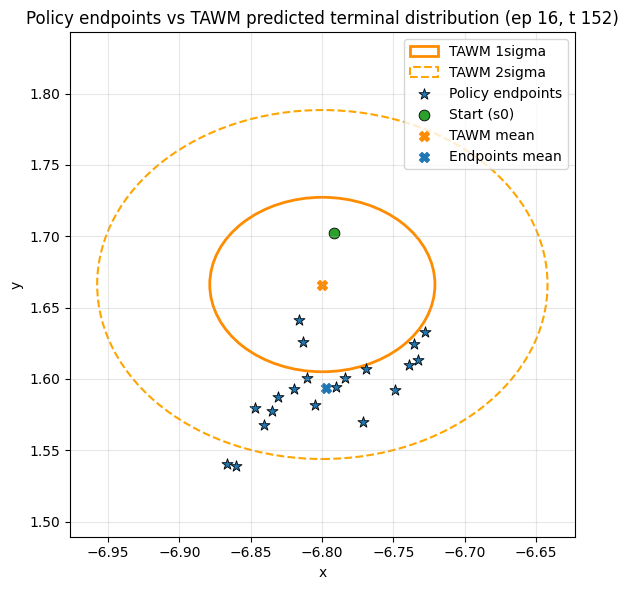

Plotting for episode 927, timestep 392 


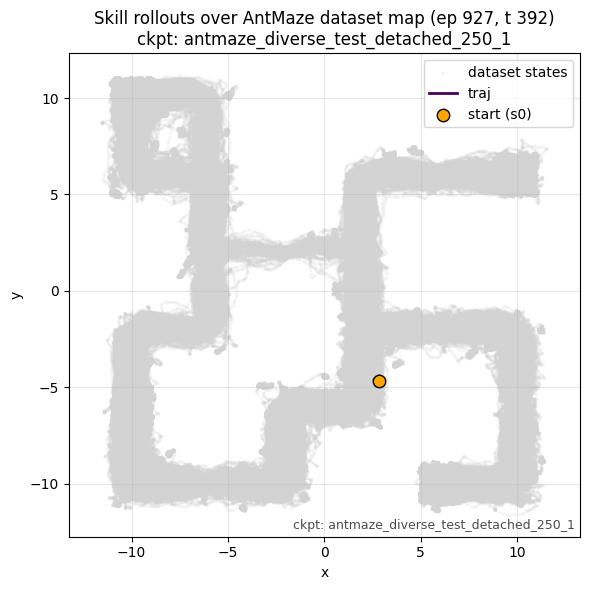

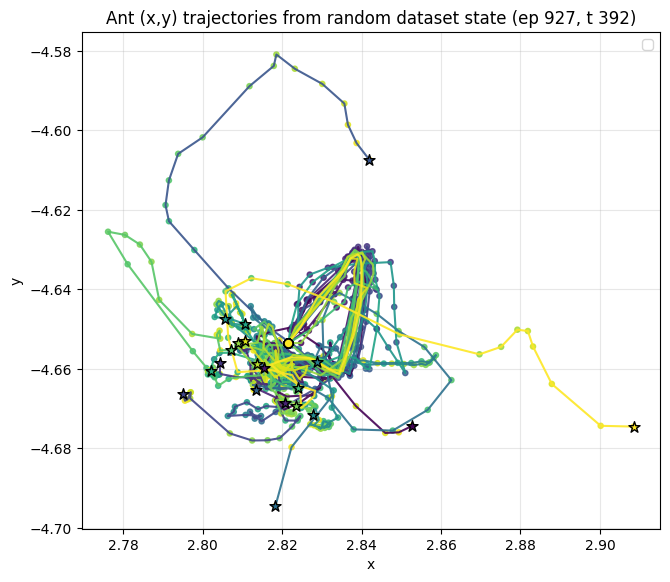

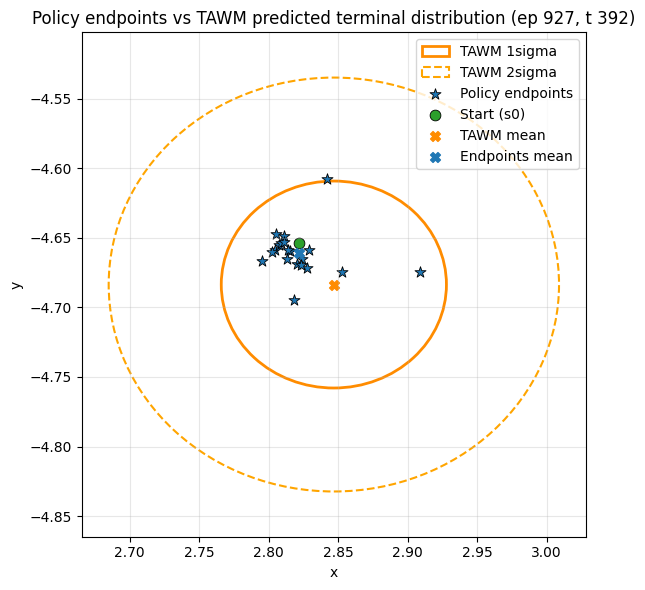

Plotting for episode 409, timestep 593 


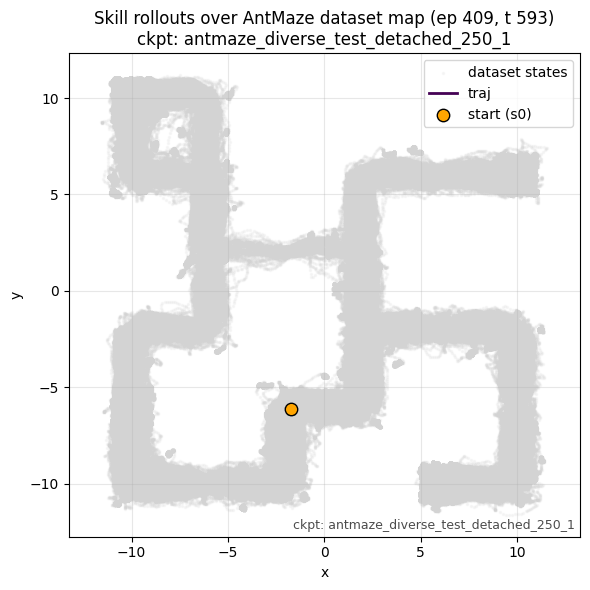

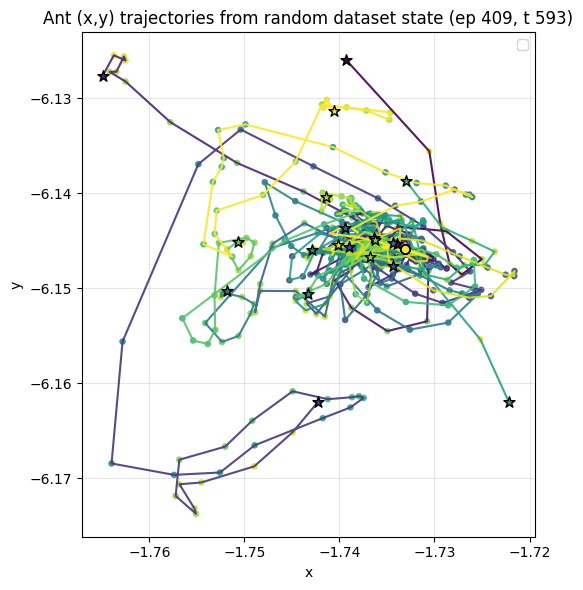

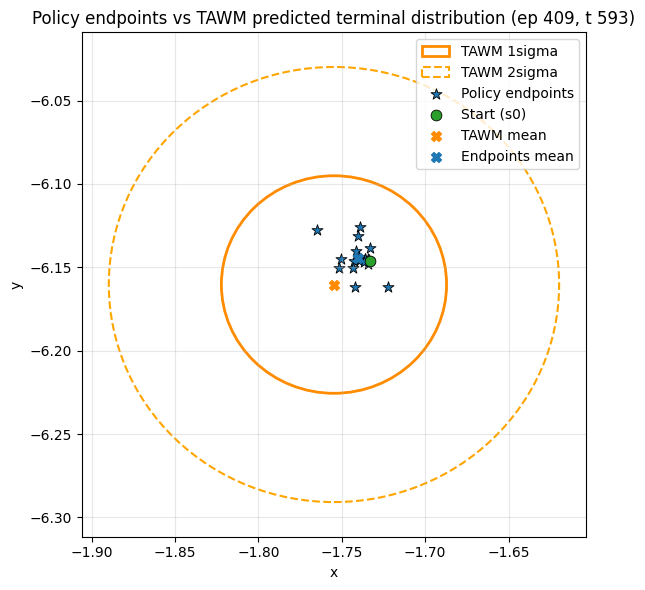

Plotting for episode 582, timestep 724 


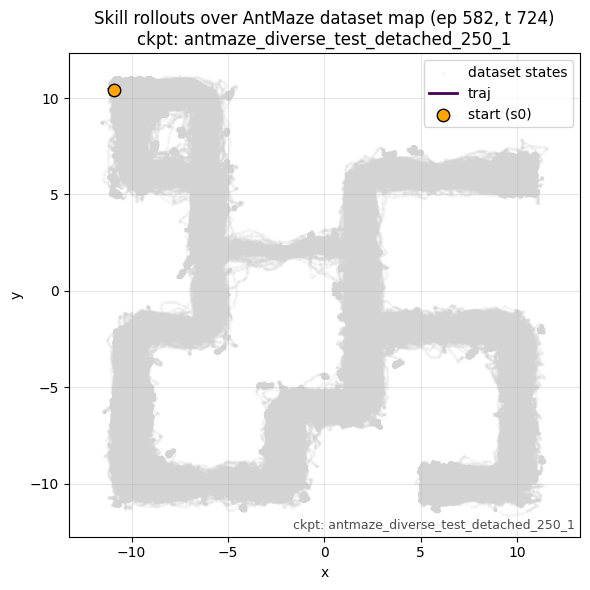

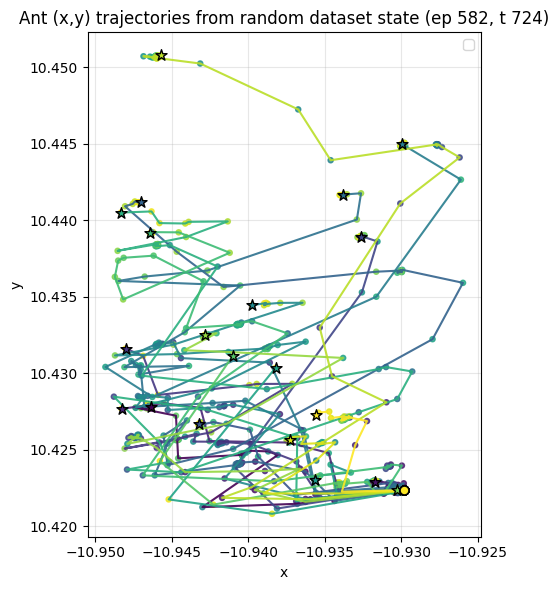

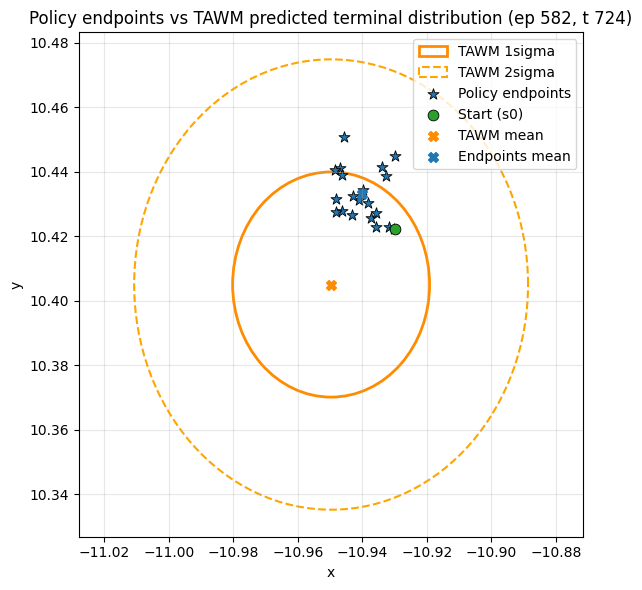

Plotting for episode 231, timestep 554 


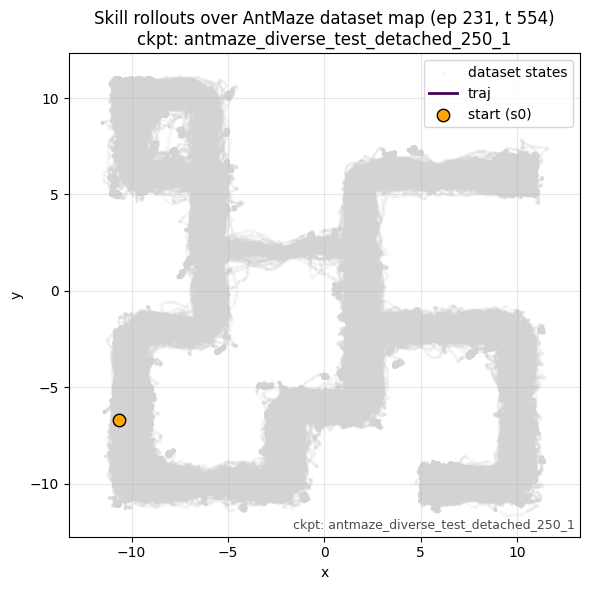

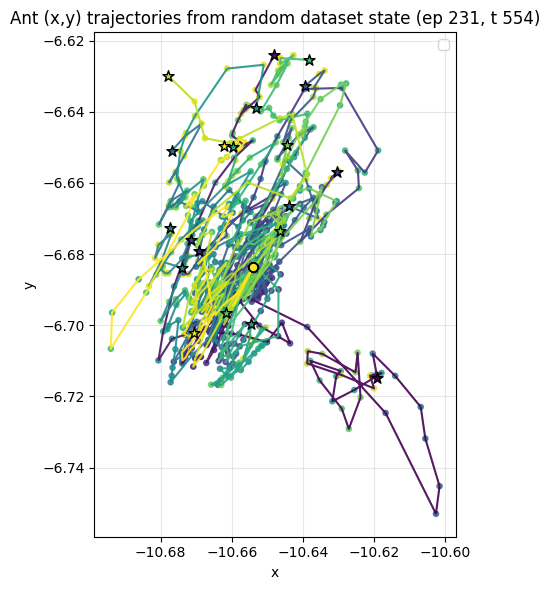

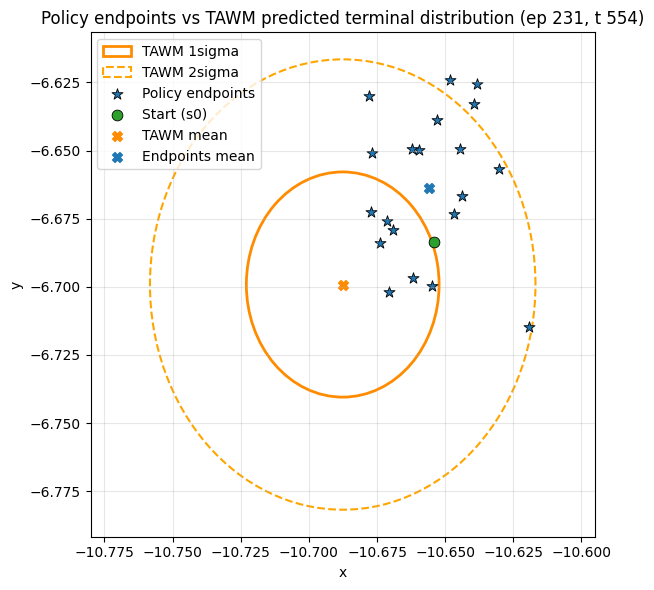

Plotting for episode 788, timestep 736 


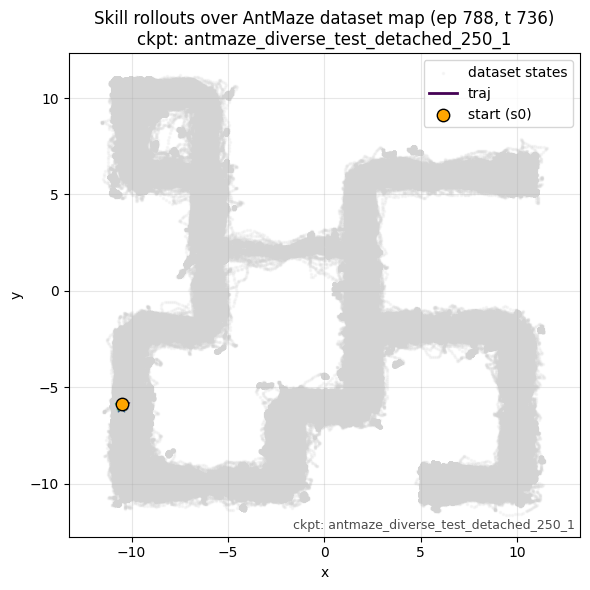

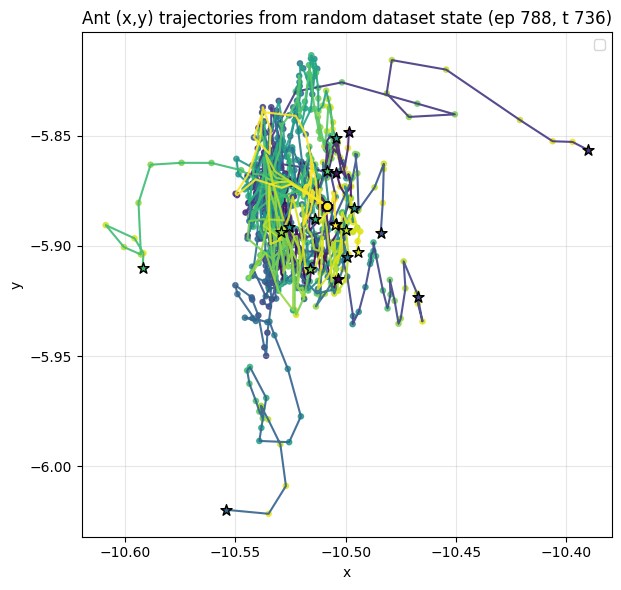

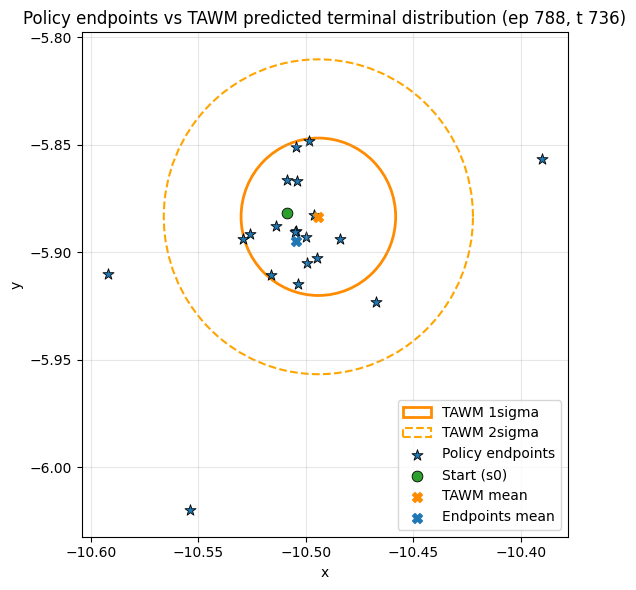

Plotting for episode 629, timestep 929 


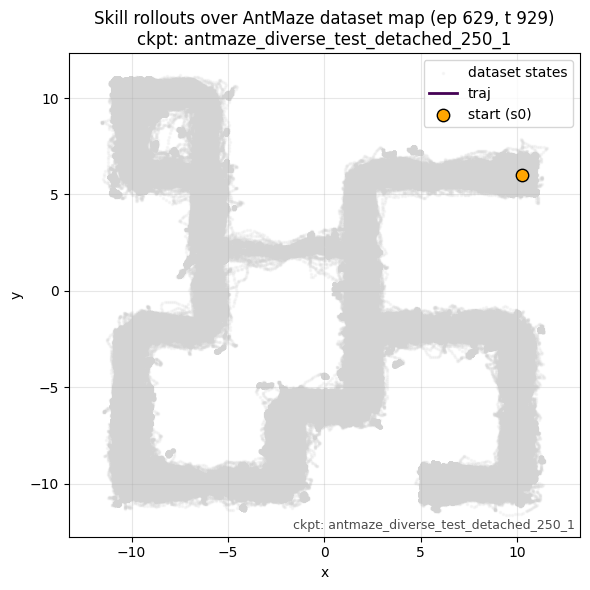

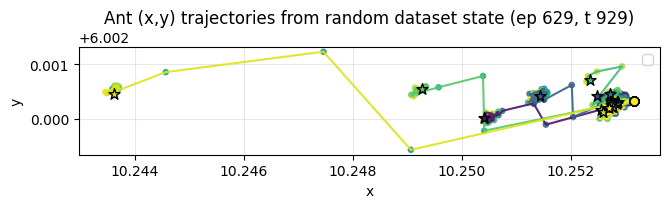

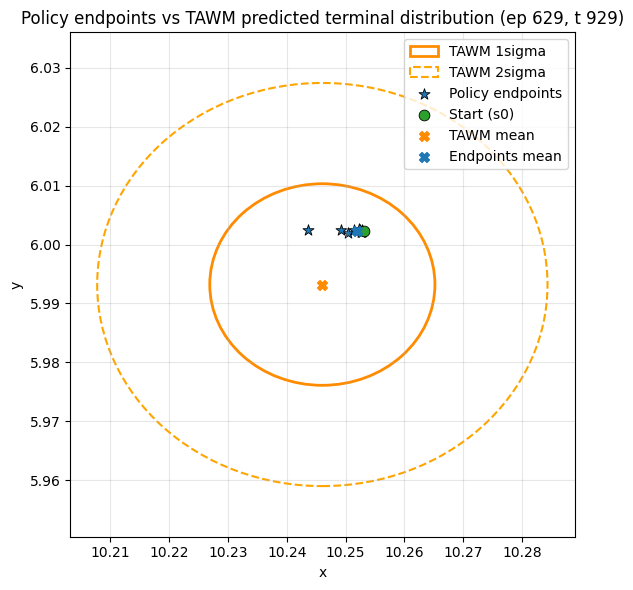

Plotting for episode 244, timestep 959 


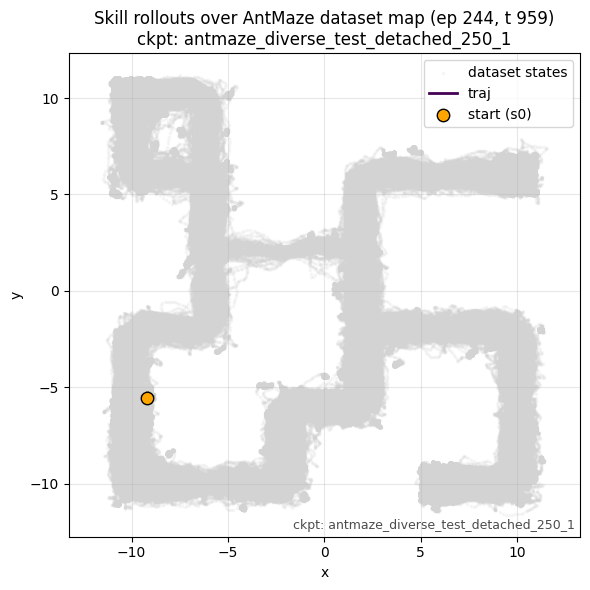

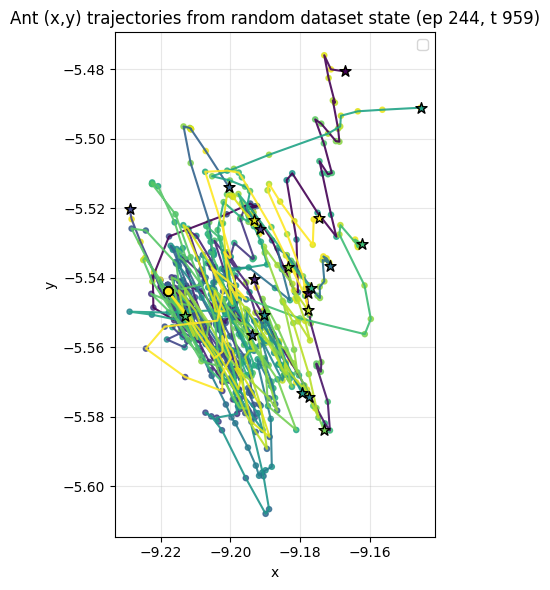

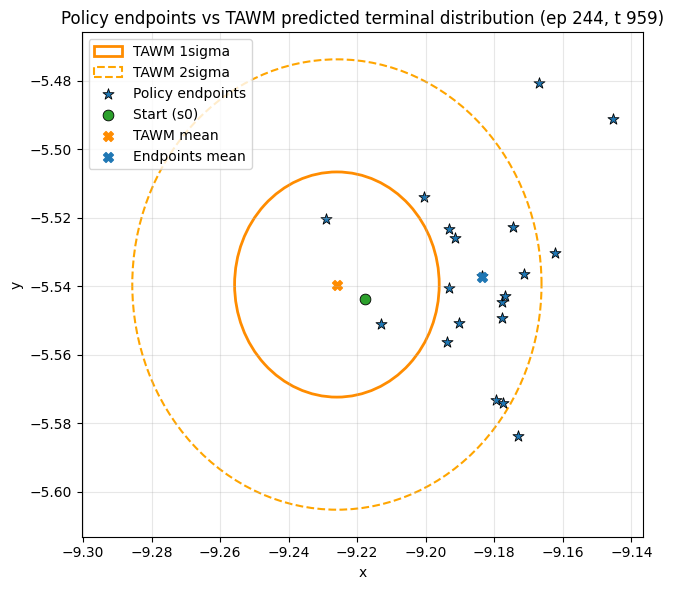

Plotting for episode 231, timestep 905 


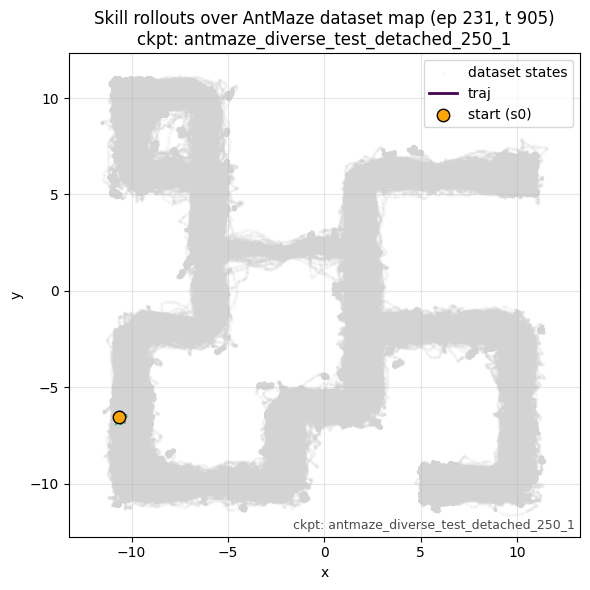

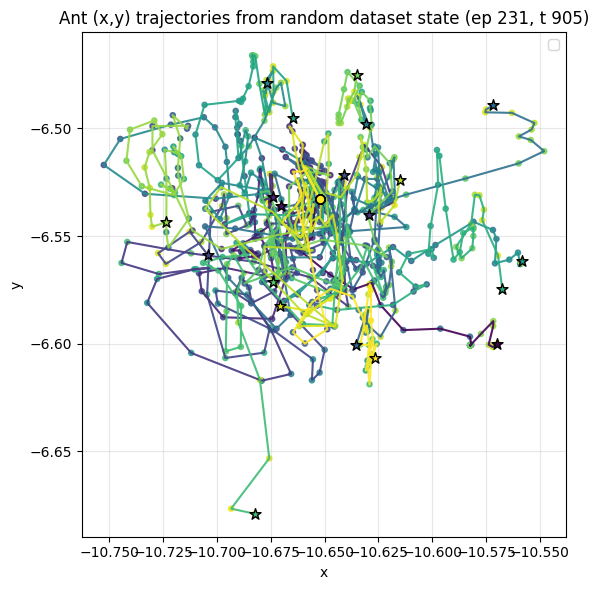

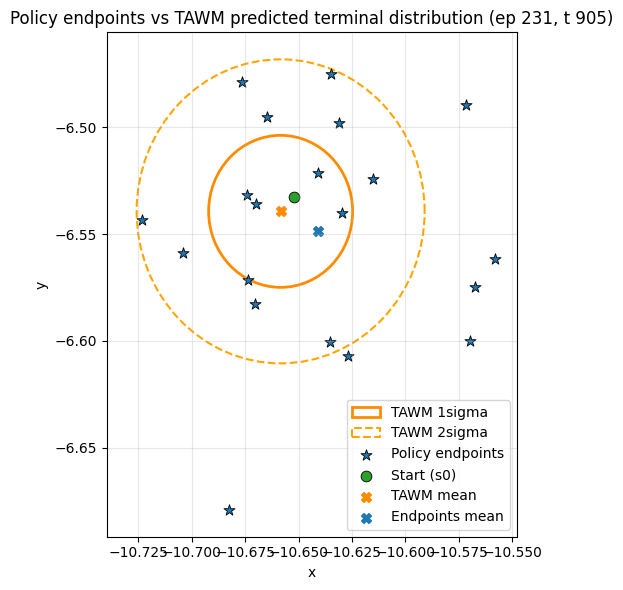

Plotting for episode 25, timestep 71 


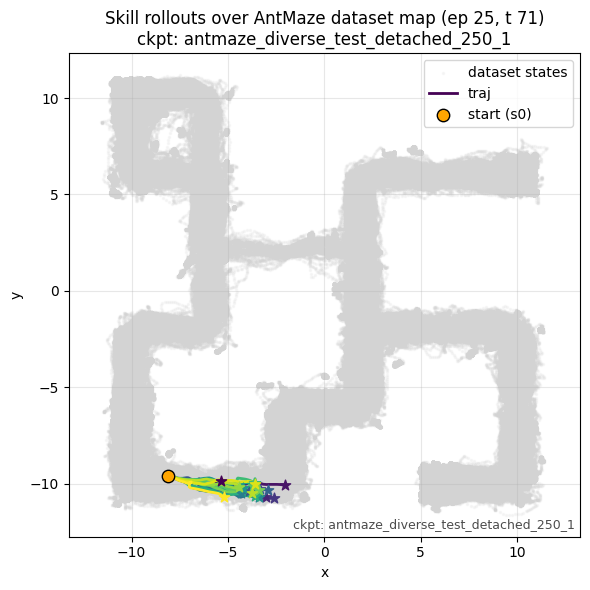

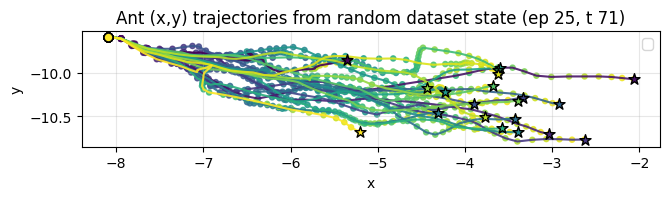

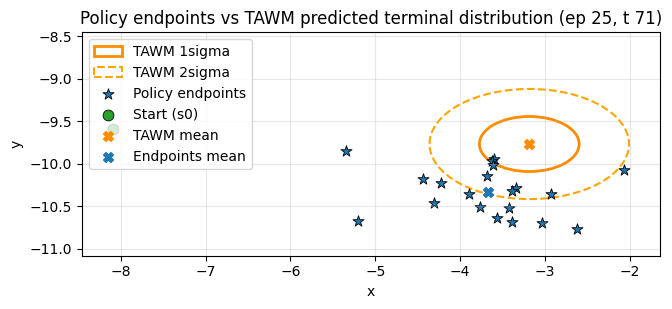

Plotting for episode 824, timestep 222 


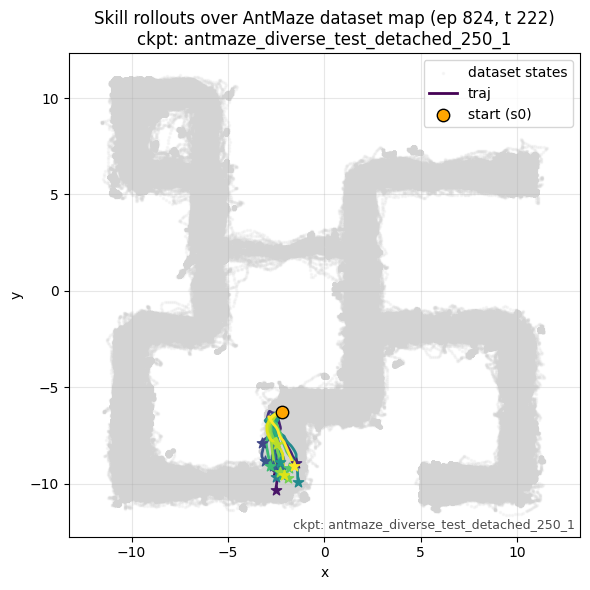

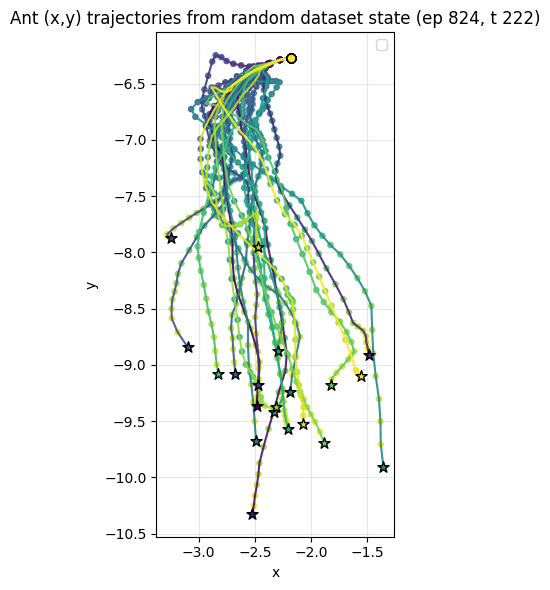

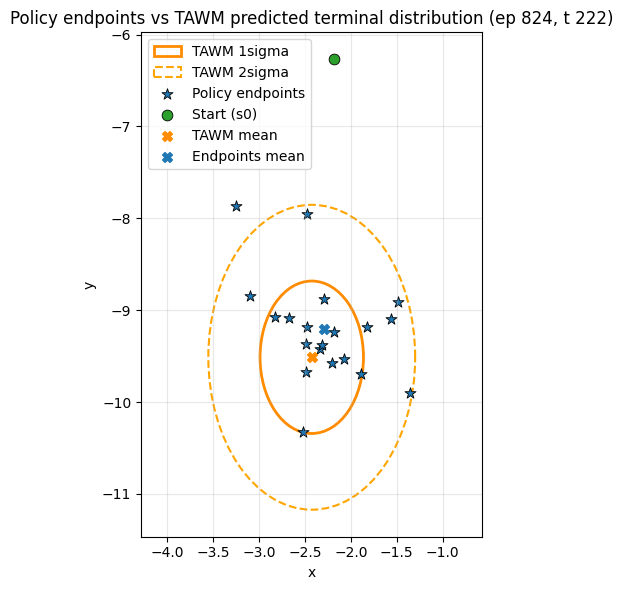

Plotting for episode 184, timestep 364 


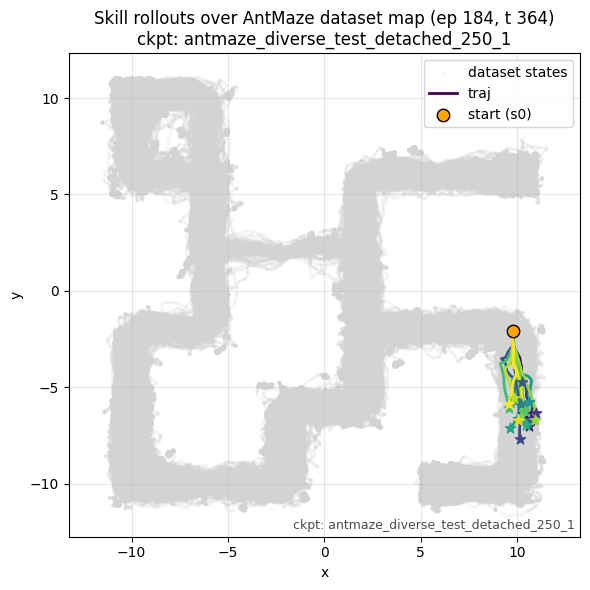

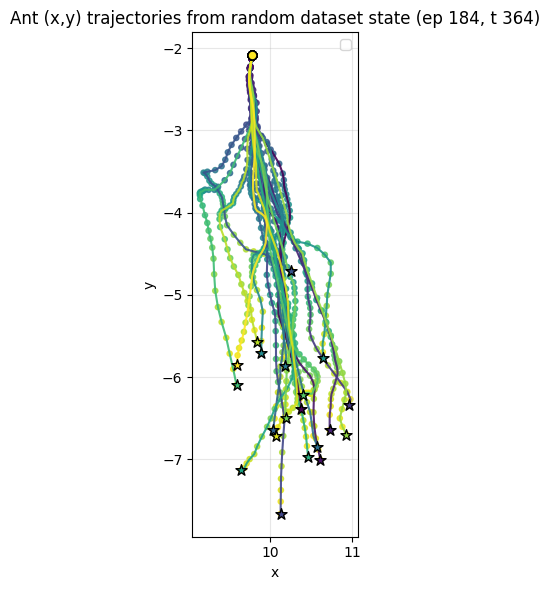

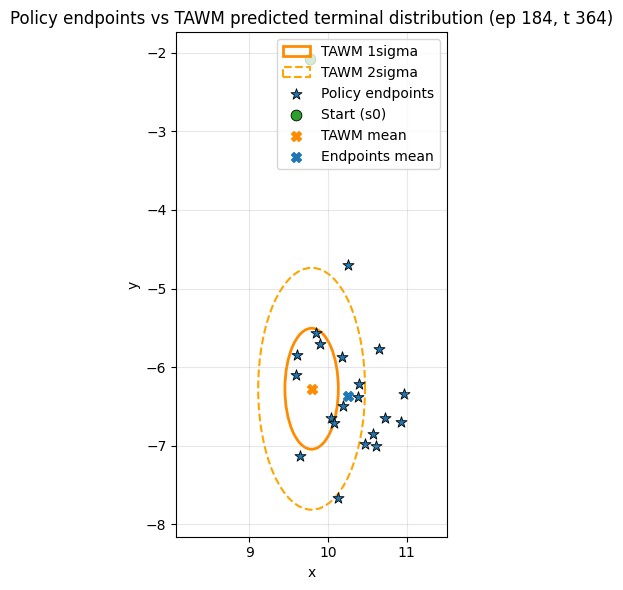

Plotting for episode 518, timestep 160 


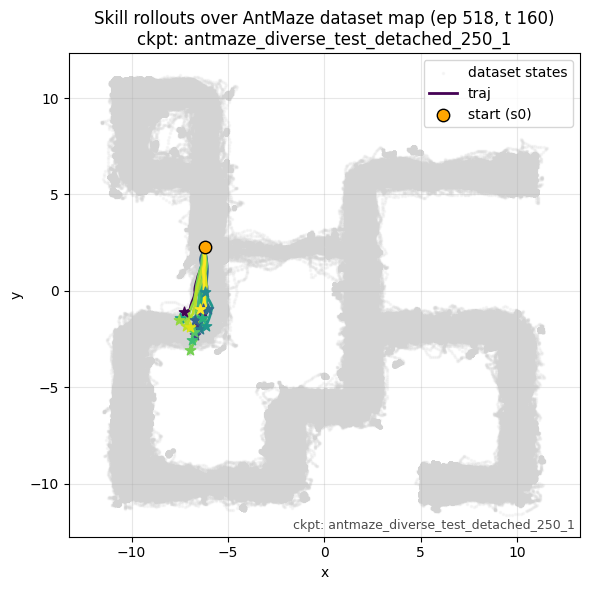

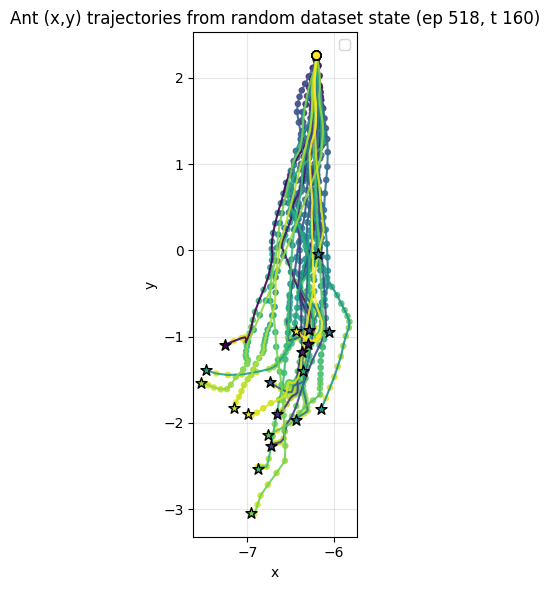

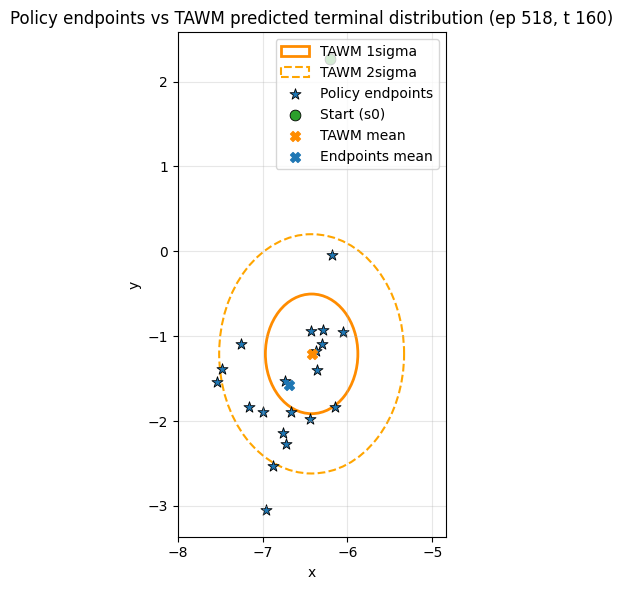

Plotting for episode 812, timestep 63 


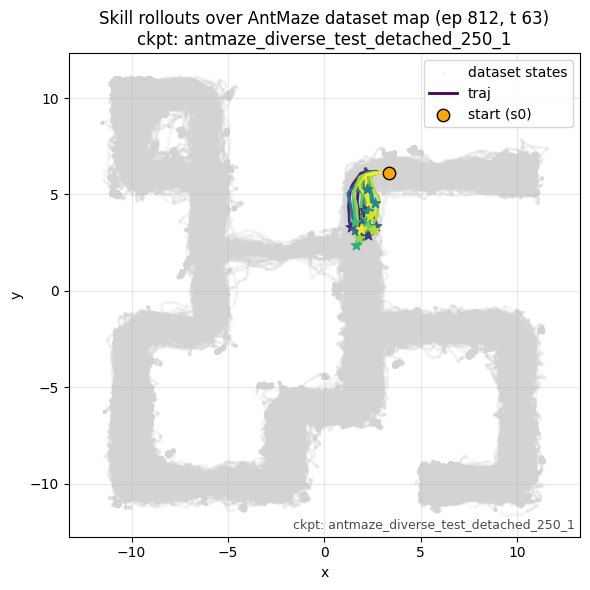

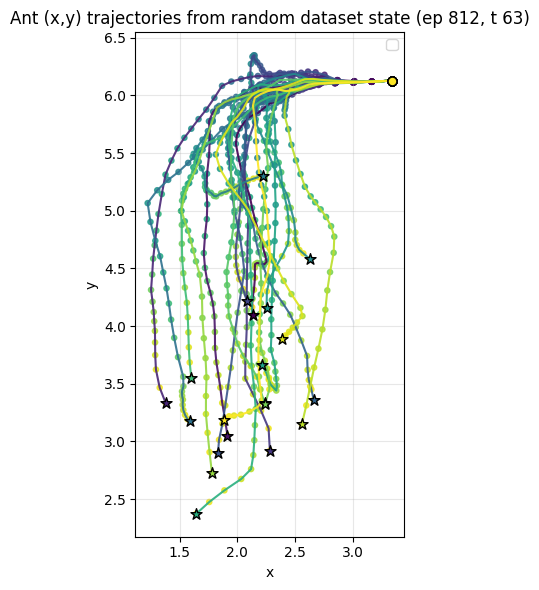

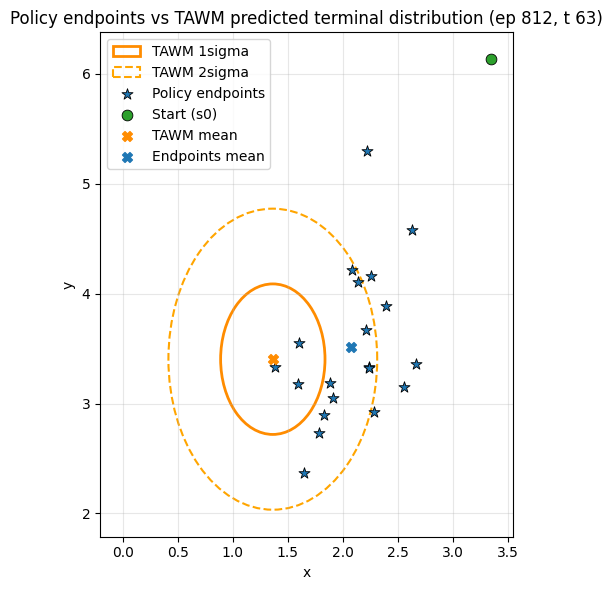

Plotting for episode 438, timestep 602 


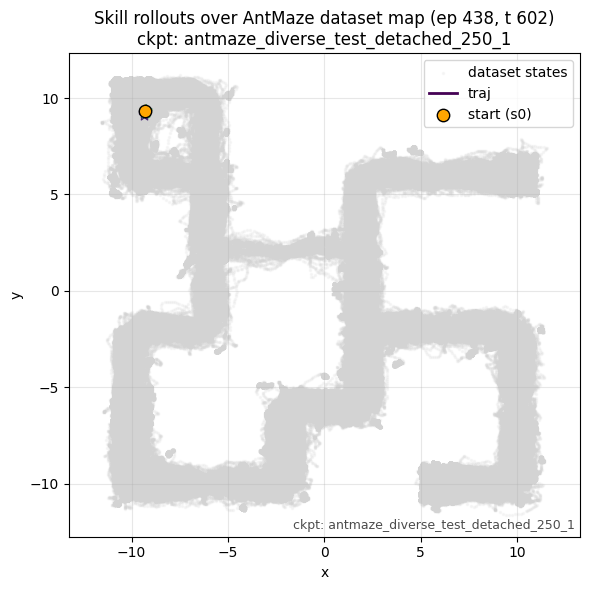

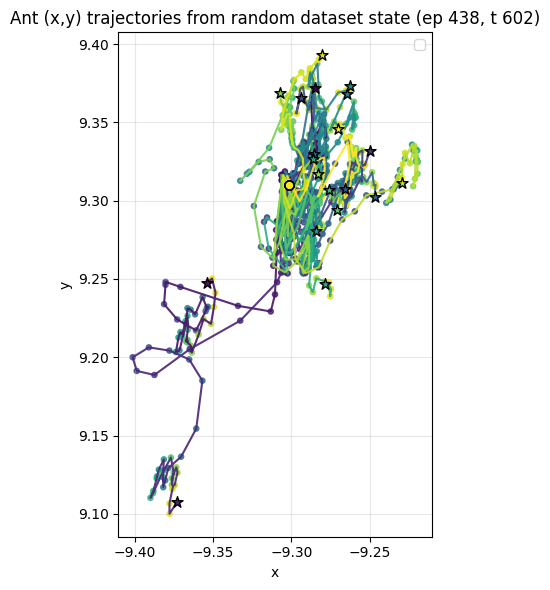

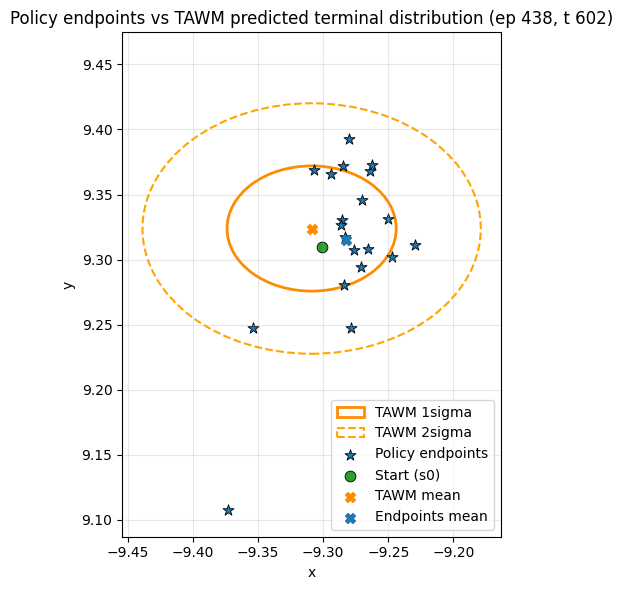

Plotting for episode 53, timestep 819 


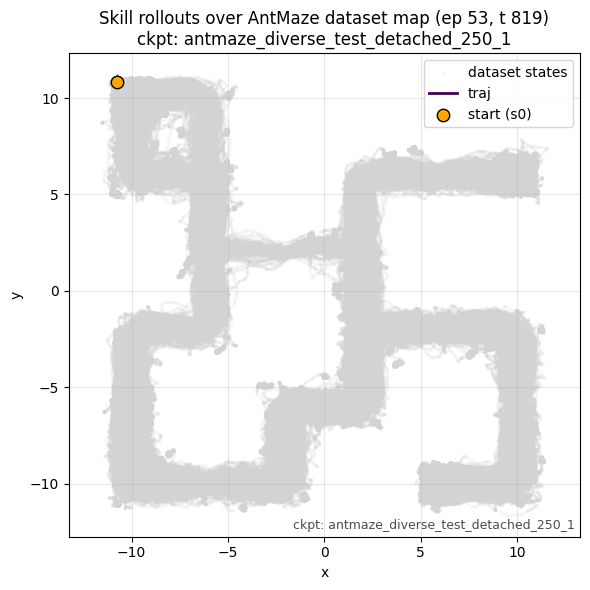

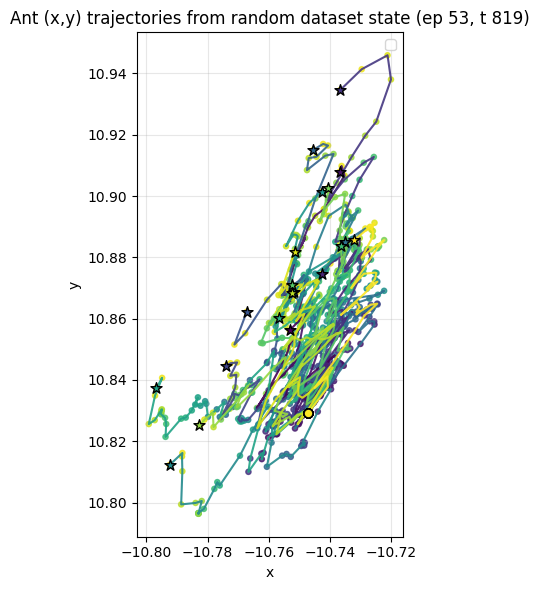

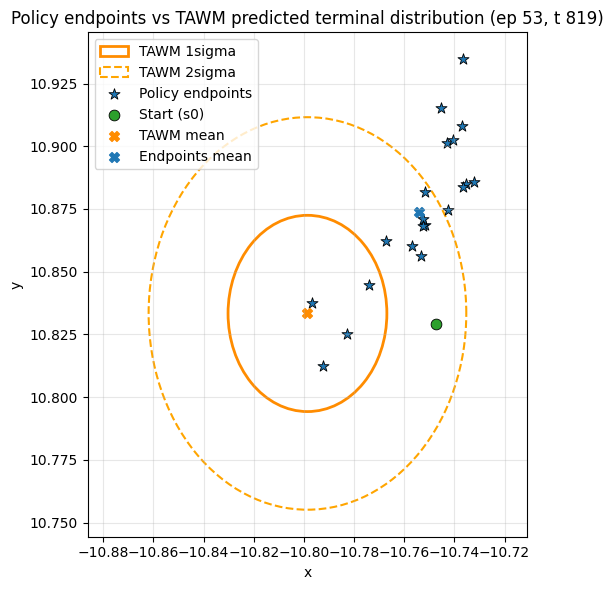

Plotting for episode 268, timestep 160 


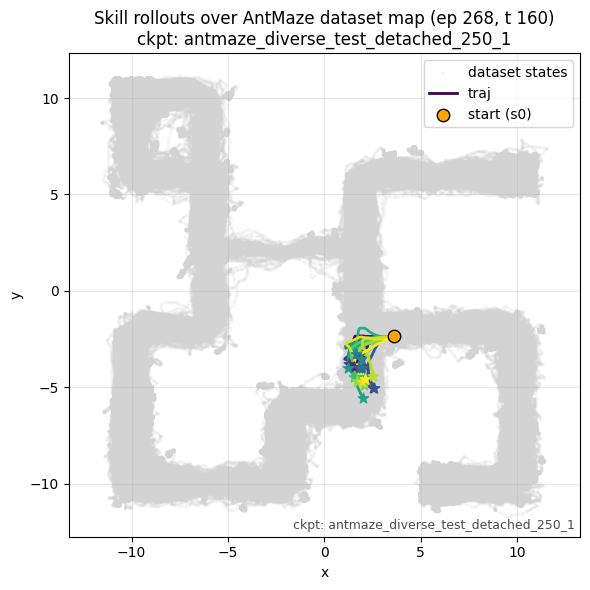

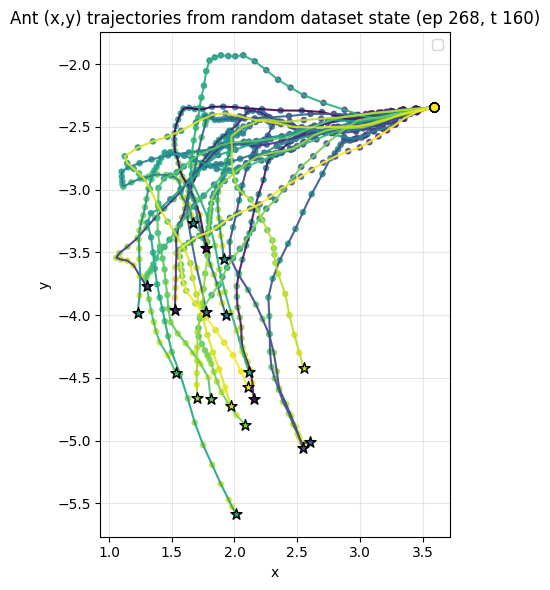

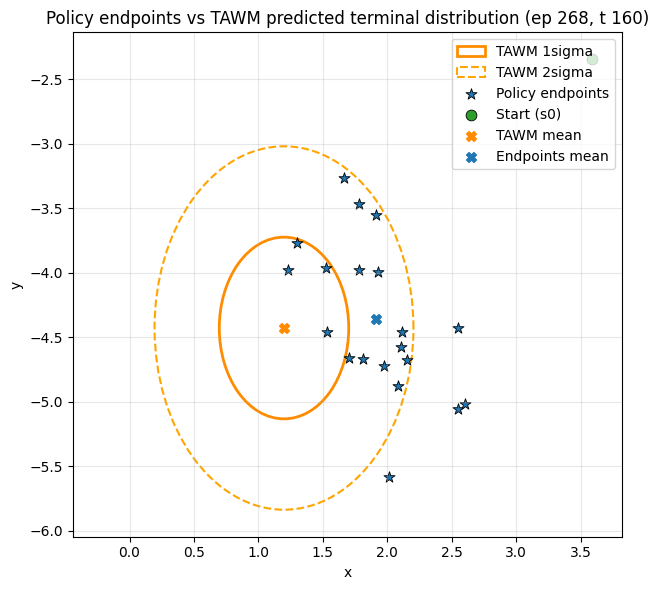

Plotting for episode 255, timestep 78 


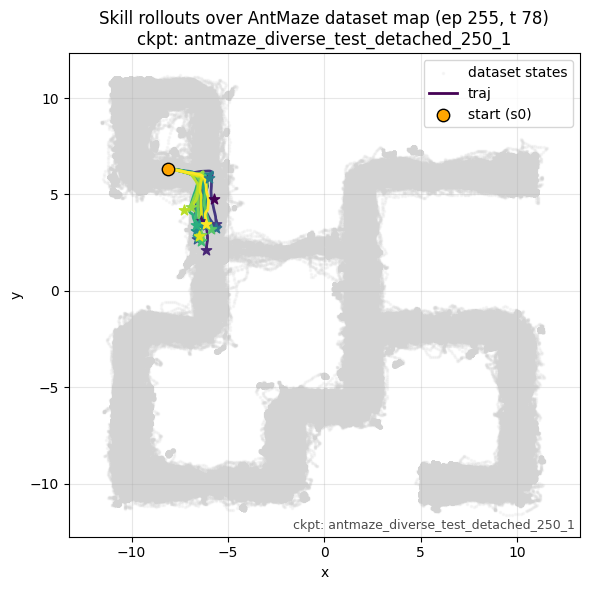

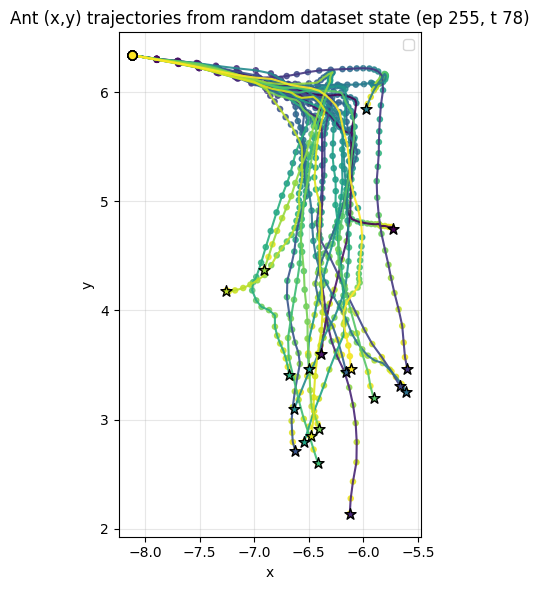

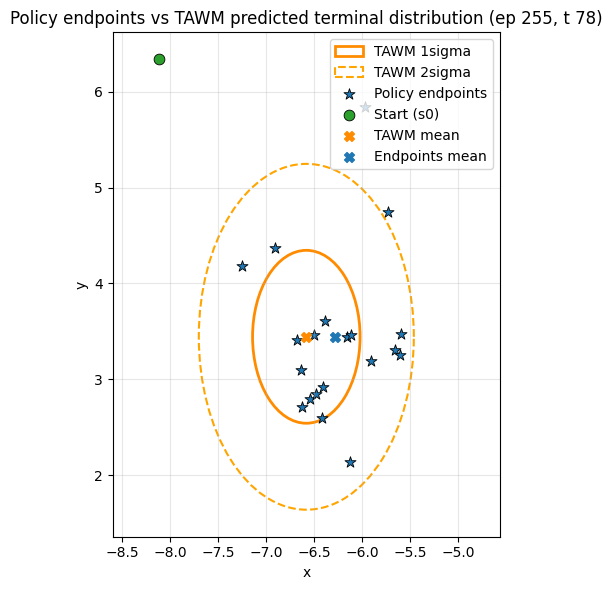

Plotting for episode 15, timestep 440 


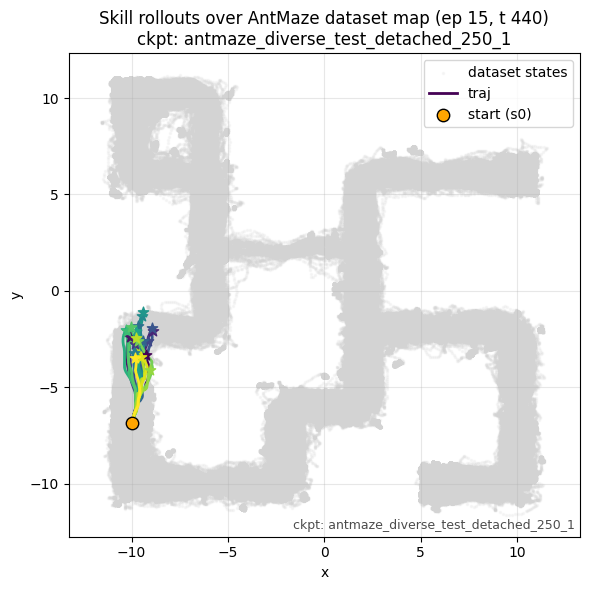

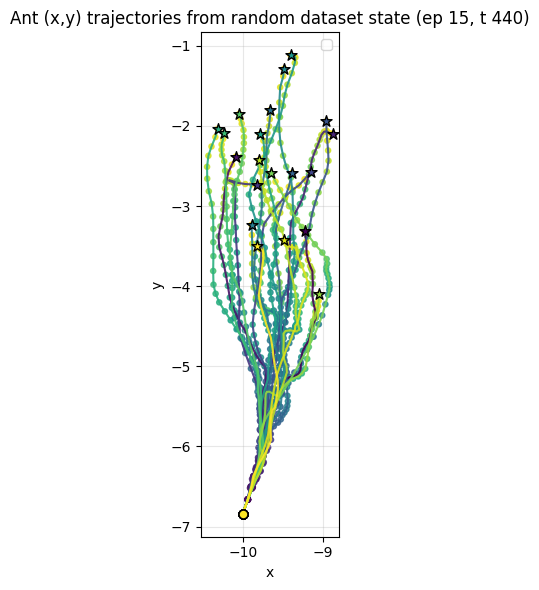

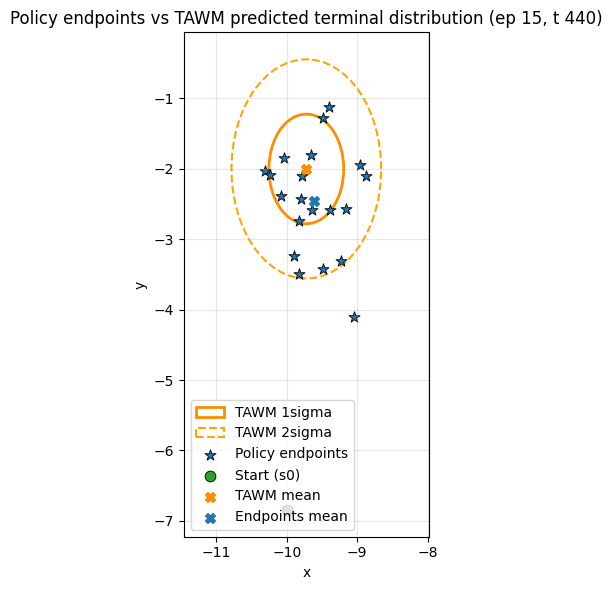

Plotting for episode 861, timestep 882 


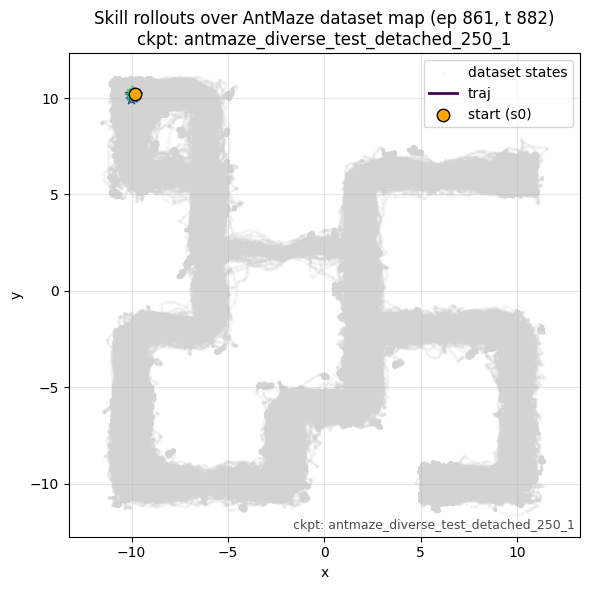

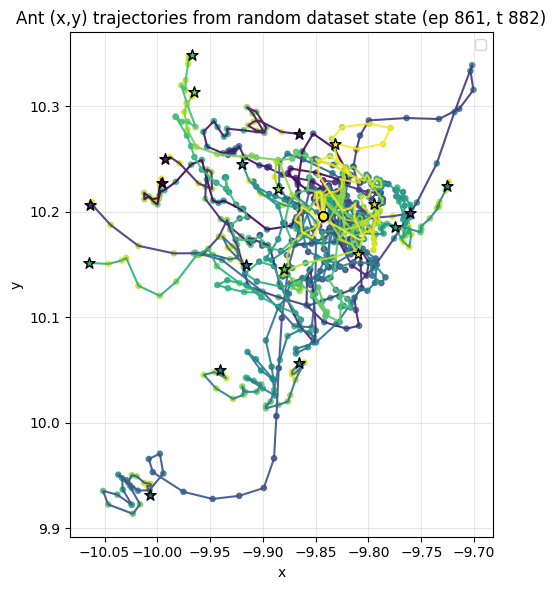

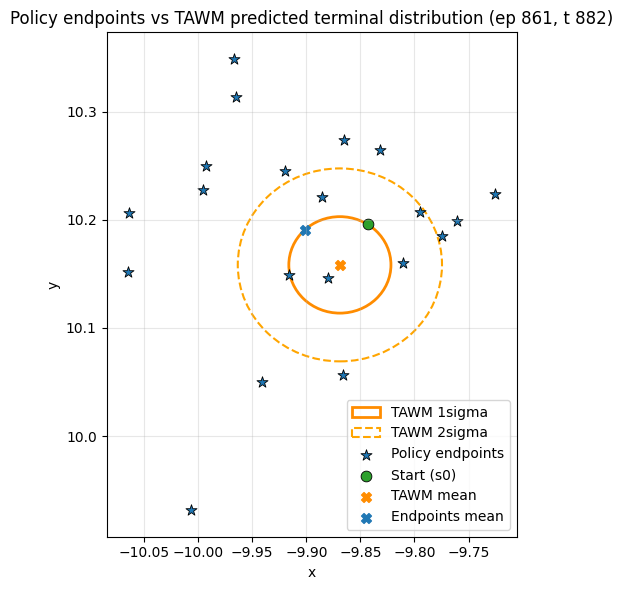

In [6]:
def collect_all_states(ant_maze_dataset):
    """
    Collect every (episode_idx, t, s_obs, s_ag) pair from the dataset.
    """
    all_states = []
    for ep_idx, ep in enumerate(ant_maze_dataset.iterate_episodes()):
        obs = ep.observations["observation"]
        ag = ep.observations["achieved_goal"]
        L = len(obs)
        for t in range(L):
            all_states.append((
                ep_idx,
                t,
                obs[t].astype(np.float32),
                ag[t].astype(np.float32),
            ))
    return all_states


def sample_random_states_from_dataset(ant_maze_dataset, num_states=5, seed=0):
    """
    Uniformly sample random states from *all* states in the dataset.
    Returns a list of (ep_idx, t, s_obs, s_ag).
    """
    all_states = collect_all_states(ant_maze_dataset)

    rng = np.random.default_rng(seed)
    idxs = rng.choice(len(all_states), size=min(num_states, len(all_states)), replace=False)
    return [all_states[i] for i in idxs]
 
env = recover_ant_env()

# Sample K random states from the dataset
random_states = sample_random_states_from_dataset(
    ant_maze_dataset,
    num_states=50,   
    seed=123
)

all_xy = []

for ep in ant_maze_dataset.iterate_episodes():
    xy = ep.observations["achieved_goal"][:, :2]  
    all_xy.append(xy)

all_xy = np.concatenate(all_xy, axis=0)


for k, (ep_idx, t, s0_obs_ds, s0_ag_ds) in enumerate(random_states):
    print(f"Plotting for episode {ep_idx}, timestep {t} ")

    # For each state, sample a skill using prior and use low-level policy to rollout that skill from the random state
    trajs_xy, zs_used, s0_env = rollout_xy_trajectories(
        env,
        s0_obs_ds,
        s0_ag_ds,
        N_trajs=20,
        horizon=40,
        seed=1000 + k, # ensure different skill sampled for each state
        resample_skill_per_traj=False,
        use_prior=True
    )

    s0_xy = s0_ag_ds[:2]

    meta = {"ep": ep_idx, "t": t, "k": k}

    plot_skills_on_global_map(
        all_xy, trajs_xy, s0_xy=s0_xy,
        title=f"Skill rollouts over AntMaze dataset map (ep {ep_idx}, t {t})",
        save=True, stem="global_map", meta=meta
    )

    plot_xy_trajectories(
        trajs_xy,
        title=f"Ant (x,y) trajectories from random dataset state (ep {ep_idx}, t {t})",
        save=True, stem="traj_detail", meta=meta
    )

    plot_endpoints_vs_tawm(
        trajs_xy, s0_env, zs_used[0],
        s0_xy=trajs_xy[0][0],
        title=f"Policy endpoints vs TAWM predicted terminal distribution (ep {ep_idx}, t {t})",
        save=True, stem="endpoints_vs_tawm", meta=meta
    )



train episodes:800  val episodes:0  test episodes:200
train subtrajs:256800  val subtrajs:0  test subtrajs:64200


/var/folders/wp/q7yyy4ls2m3bvyscgh359t0r0000gn/T/ipykernel_62356/266194927.py:168: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("viridis", len(trajs_xy))


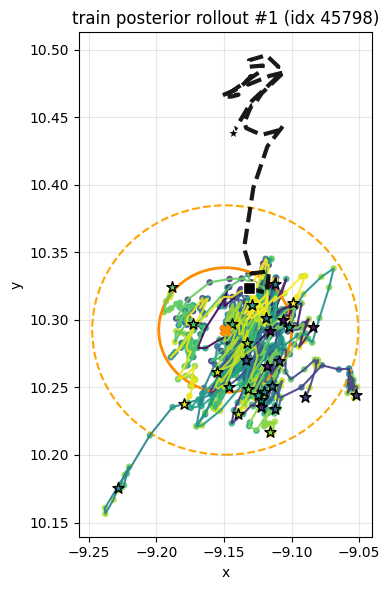

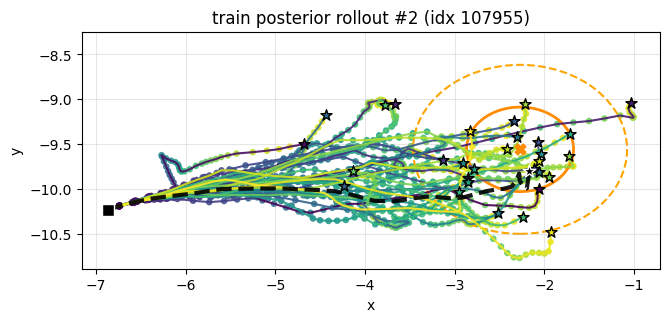

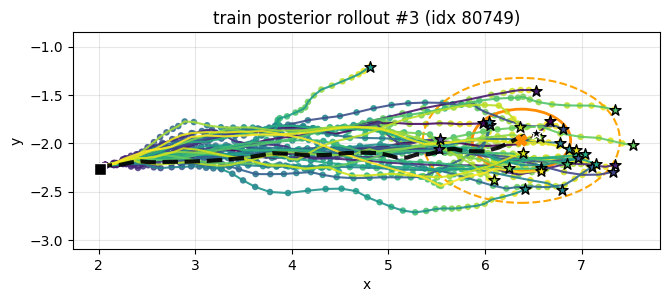

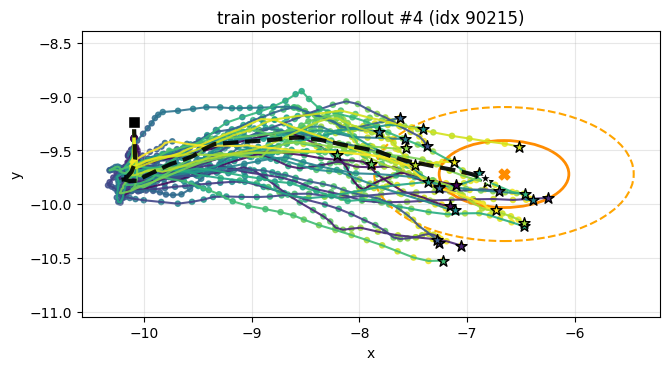

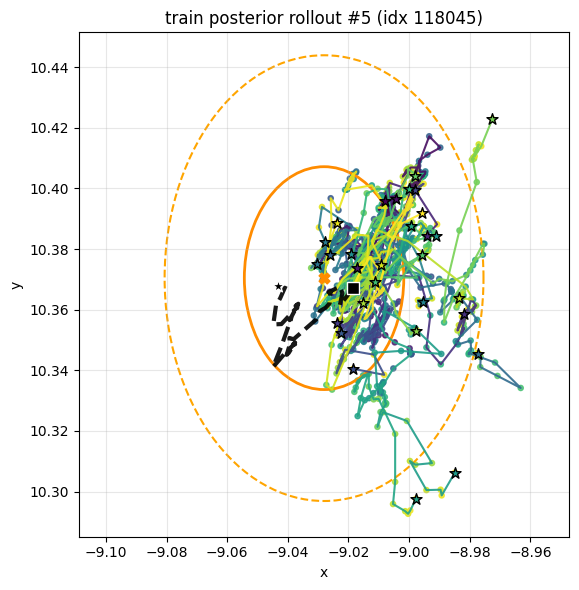

...

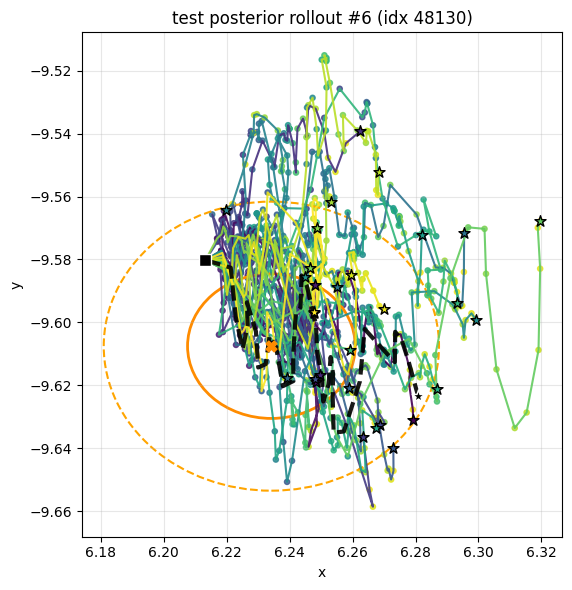

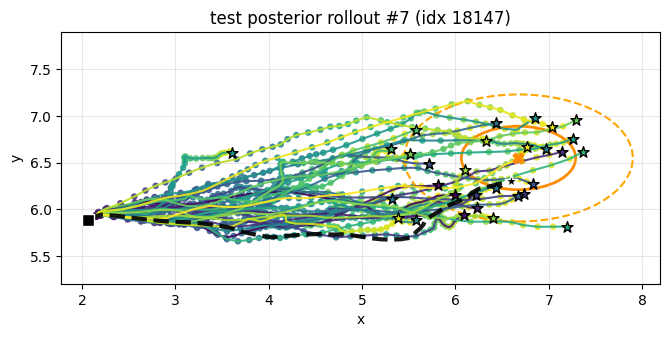

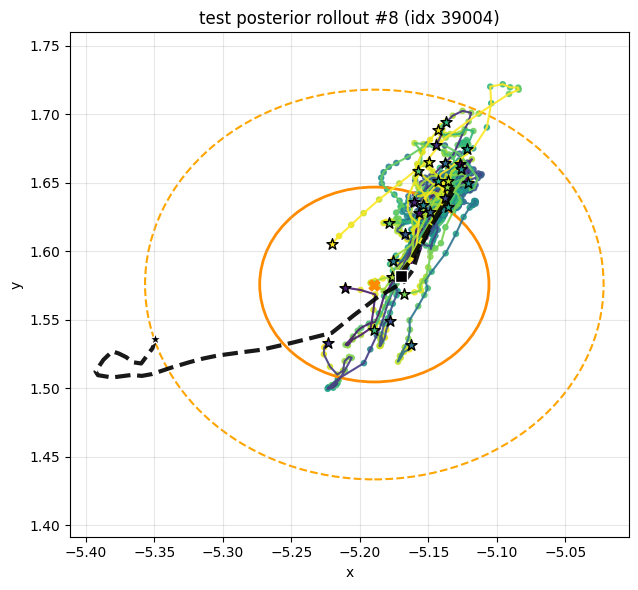

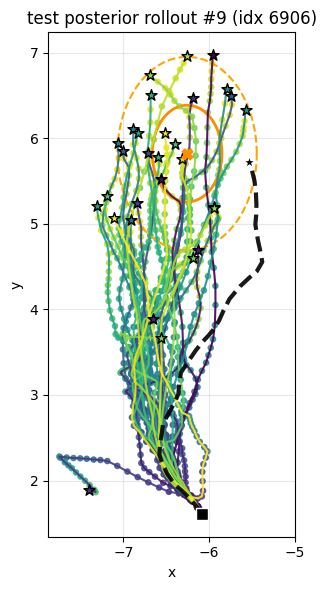

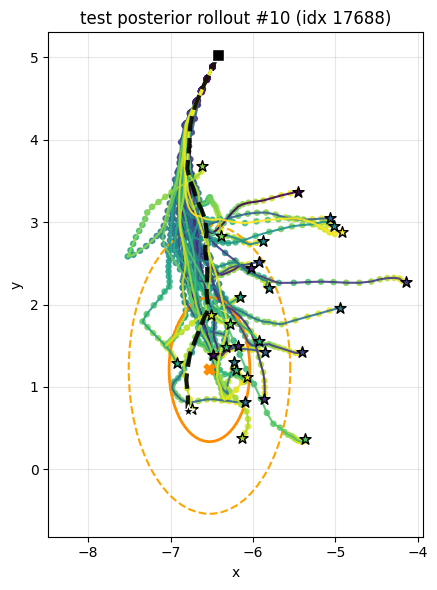

In [7]:
def make_episode_splits(minari_dataset, train=0.8, val=0.1, test=0.1, seed=0):
    """Return three lists of episode indices (train_ids, val_ids, test_ids)."""
    episodes = list(minari_dataset.iterate_episodes())
    n = len(episodes)
    idxs = list(range(n))
    rng = np.random.RandomState(seed)
    rng.shuffle(idxs)
    n_train = int(round(train * n))
    n_val   = int(round(val * n))
    train_ids = idxs[:n_train]
    val_ids   = idxs[n_train:n_train+n_val]
    test_ids  = idxs[n_train+n_val:]
    return train_ids, val_ids, test_ids

class SubtrajDataset(Dataset):
    """
    Build (s0, state_seq, action_seq, sT) from a subset of episodes.
    """
    def __init__(self, minari_dataset, T, episode_ids, stride=3):
        self.T = T
        self.items = []

        ep_id_set = set(episode_ids)
        for ep_idx, ep in enumerate(minari_dataset.iterate_episodes()):
            if ep_idx not in ep_id_set:
                continue

            obs = ep.observations["observation"]      
            ach = ep.observations["achieved_goal"]    
            act = ep.actions                          
            Ltot = len(obs)
            if Ltot < T + 1:
                continue

            state_ext = np.concatenate([obs, ach], axis=-1).astype(np.float32)  

            for t in range(0, Ltot - T, stride):
                state_seq  = state_ext[t:t+T]                 
                s0 = state_seq[0]                   
                action_seq = act[t:t+T].astype(np.float32)   
                sT = state_ext[t+T]                  
                self.items.append((s0, state_seq, action_seq, sT))

    def __len__(self):
        return len(self.items)

    def __getitem__(self, i):
        s0, S, A, sT = self.items[i]  
        return {
            "s0": torch.as_tensor(s0, dtype=torch.float32),
            "state_sequence": torch.as_tensor(S, dtype=torch.float32),
            "action_sequence": torch.as_tensor(A, dtype=torch.float32),
            "sT": torch.as_tensor(sT, dtype=torch.float32),
        }

def collate(batch):
    return {
        "s0": torch.stack([b["s0"] for b in batch], 0),
        "state_sequence": torch.stack([b["state_sequence"] for b in batch], 0),
        "action_sequence": torch.stack([b["action_sequence"] for b in batch], 0),
        "sT": torch.stack([b["sT"] for b in batch], 0),
    }

train_ids, val_ids, test_ids = make_episode_splits(
    ant_maze_dataset, train=0.8, val=0.0, test=0.2, seed=0
)
print(f"train episodes:{len(train_ids)}  val episodes:{len(val_ids)}  test episodes:{len(test_ids)}")

train_ds = SubtrajDataset(ant_maze_dataset, T=T, episode_ids=train_ids, stride=3)
val_ds   = SubtrajDataset(ant_maze_dataset, T=T, episode_ids=val_ids,   stride=3)
test_ds  = SubtrajDataset(ant_maze_dataset, T=T, episode_ids=test_ids,  stride=3)

print(f"train subtrajs:{len(train_ds)}  val subtrajs:{len(val_ds)}  test subtrajs:{len(test_ds)}")

B = 100  
train_loader = DataLoader(train_ds, batch_size=B, shuffle=True,  collate_fn=collate, drop_last=False)
val_loader   = DataLoader(val_ds,   batch_size=B, shuffle=False, collate_fn=collate, drop_last=False)
test_loader  = DataLoader(test_ds,  batch_size=B, shuffle=False, collate_fn=collate, drop_last=False)

@torch.no_grad()
def rollout_xy_trajectories(
    env,
    s0_obs_ds,
    s0_ag_ds=None,
    N_trajs=3,
    horizon=T,
    seed=0,
    resample_skill_per_traj=True,
    use_prior=True,
    z_fixed=None,
):
    """
    Reset env to dataset start (s0_obs_ds, s0_ag_ds), choose skill z,
    roll out pi_theta(a|s,z) for H steps.
    """
    H = horizon
    np.random.seed(seed)
    torch.manual_seed(seed)

    # MuJoCo state for this dataset s0
    s0_qpos, s0_qvel = split_obs_to_qpos_qvel(s0_obs_ds, s0_ag_ds, env)

    trajs_xy, zs_used = [], []

    # Precompute z if we want same skill for all trajectories
    z_global = None
    if not resample_skill_per_traj:
        env.reset()
        set_env_state(env, s0_qpos, s0_qvel)
        obs = read_antmaze_obs(env)
        _, _, s0_env = pack_state_from_obs(obs)
        s0_t = to_torch(s0_env).unsqueeze(0)

        if z_fixed is not None:
            z_global = z_fixed.to(device).detach().clone()
        elif use_prior:
            mu_pr, std_pr = p_omega(s0_t)
            z_global = (mu_pr + std_pr * torch.randn_like(mu_pr)).squeeze(0)

    for k in range(N_trajs):
        env.reset()
        set_env_state(env, s0_qpos, s0_qvel)

        obs = read_antmaze_obs(env)
        _, ag0, s0_env = pack_state_from_obs(obs)
        s0_t = to_torch(s0_env).unsqueeze(0)

        if resample_skill_per_traj:
            if z_fixed is not None:
                z = z_fixed.to(device).detach().clone()
            elif use_prior:
                mu_pr, std_pr = p_omega(s0_t)
                z = (mu_pr + std_pr * torch.randn_like(mu_pr)).squeeze(0)
            else:
                raise ValueError("If use_prior=False and z_fixed is None, no skill source.")
        else:
            z = z_global

        zs_used.append(z.detach().cpu())

        xy = [ag0.copy()]
        cur_obs = obs
        pi_theta.eval()
        for t in range(H):
            _, _, st = pack_state_from_obs(cur_obs)
            st_t = to_torch(st).unsqueeze(0)
            a_mu, a_std = pi_theta(st_t, z.unsqueeze(0).to(device))
            a_dist = policy_dist(a_mu, a_std)
            a = a_dist.sample().squeeze(0).cpu().numpy().astype(np.float32)

            cur_obs, _, term, trunc, _ = env.step(a)
            _, ag_t, _ = pack_state_from_obs(cur_obs)
            xy.append(ag_t.copy())
            if term or trunc:
                break

        trajs_xy.append(np.stack(xy, axis=0))

    return trajs_xy, zs_used, s0_env

def plot_xy_trajectories(trajs_xy, title="", s0_env=None, z=None, demo_xy=None, save=False, stem="traj_detail", meta=None):
    """
    Plot each rollout trajectory as a line with start circle, end star.
    If s0_env and z are given, overlay TAWM ellipses and mean.
    If demo_xy is given, overlay the dataset subtrajectory used for the posterior.
    """
    fig, ax = plt.subplots(figsize=(6.8, 6))
    colors = cm.get_cmap("viridis", len(trajs_xy))

    all_xy = np.concatenate(trajs_xy, axis=0)

    # rollout trajectories
    for i, xy in enumerate(trajs_xy):
        c = colors(i)
        ax.plot(xy[:, 0], xy[:, 1], "-", lw=1.5, alpha=0.9, color=c, label=f"traj {i}")
        ax.scatter(xy[0, 0],  xy[0, 1],  s=40, marker="o", color=c, edgecolor="k", zorder=3)
        ax.scatter(xy[-1,0], xy[-1,1], s=70, marker="*", color=c, edgecolor="k", zorder=3)
        tcolors = np.linspace(0, 1, len(xy))
        ax.scatter(xy[:,0], xy[:,1], c=tcolors, cmap="viridis", s=14, alpha=0.8)

    # overlay dataset subtrajectory used for posterior
    if demo_xy is not None:
        # thick black dashed line for the dataset subtrajectory
        ax.plot(
            demo_xy[:, 0], demo_xy[:, 1],
            "k--", lw=3, alpha=0.9, label="dataset subtrajectory"
        )
        # mark its start and end
        ax.scatter(demo_xy[0, 0], demo_xy[0, 1],
                   s=80, marker="s", c="k", edgecolor="w", zorder=5)
        ax.scatter(demo_xy[-1, 0], demo_xy[-1, 1],
                   s=90, marker="*", c="k", edgecolor="w", zorder=5)

        # include in bounds
        all_xy = np.vstack([all_xy, demo_xy])

    # TAWM ellipses
    if (s0_env is not None) and (z is not None):
        mean_xy, cov_xy = tawm_xy_gaussian(s0_env, z)

        draw_cov_ellipse(ax, mean_xy, cov_xy, n_std=1.0,
                         edgecolor="darkorange", linewidth=2, label="TAWM 1σ")
        draw_cov_ellipse(ax, mean_xy, cov_xy, n_std=2.0,
                         edgecolor="orange", linestyle="--", linewidth=1.5, label="TAWM 2σ")

        ax.scatter([mean_xy[0]], [mean_xy[1]],
                   c="darkorange", s=60, marker="X", zorder=4, label="TAWM mean")

        eigvals = np.linalg.eigvalsh(cov_xy)
        max_std = np.sqrt(eigvals.max())
        r = 2.0 * max_std
        all_xy = np.vstack([
            all_xy,
            mean_xy[None, :],
            mean_xy[None, :] + [r, r],
            mean_xy[None, :] - [r, r],
        ])

    lo = all_xy.min(axis=0)
    hi = all_xy.max(axis=0)
    pad = 0.05 * (hi - lo + 1e-9)
    ax.set_xlim(lo[0] - pad[0], hi[0] + pad[0])
    ax.set_ylim(lo[1] - pad[1], hi[1] + pad[1])

    ax.set_aspect("equal", "box")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    path = None
    if save:
        path = save_fig(fig, stem=stem, meta=meta, close=False)

    plt.show()
    return fig, path
    


@torch.no_grad()
def sample_skill_from_posterior(S_seq, A_seq):
    mu_z, std_z = q_phi(S_seq, A_seq)
    z = mu_z + std_z * torch.randn_like(mu_z)   
    return z.squeeze(0)                         

@torch.no_grad()
def posterior_rollout_and_plot_for_dataset(ds, env, K=10, tag="train"):
    """
    For K random subtrajectories in ds:
      - grab raw s0 & subtrajectory 
      - sample z from posterior
      - rollout pi_theta from s0 with fixed z
      - plot rollouts + TAWM ellipses + dataset subtrajectory
    """
    for k in range(K):
        idx = np.random.randint(len(ds))

        s0_raw, state_seq_raw, action_seq_raw, sT_raw = ds.items[idx]
        s0_obs_ds = s0_raw[:27]
        s0_ag_ds  = s0_raw[27:]

        demo_xy = state_seq_raw[:, -2:]  

        item  = ds[idx]
        S_seq = item["state_sequence"].unsqueeze(0).to(device)  
        A_seq = item["action_sequence"].unsqueeze(0).to(device)  

        z = sample_skill_from_posterior(S_seq, A_seq)

        trajs_xy, _, s0_env = rollout_xy_trajectories(
            env,
            s0_obs_ds,
            s0_ag_ds,
            N_trajs=30,
            horizon=T,
            seed=1000 + k,
            resample_skill_per_traj=False,
            use_prior=False,    
            z_fixed=z,
        )

        meta = {"tag": tag, "k": k, "idx": idx}
        plot_xy_trajectories(
            trajs_xy,
            title=f"{tag} posterior rollout #{k+1} (idx {idx})",
            s0_env=s0_env,
            z=z,
            demo_xy=demo_xy,
            save=True,
            stem="posterior_rollout",
            meta=meta
        )


env = recover_ant_env()

posterior_rollout_and_plot_for_dataset(train_ds, env, K=10, tag="train")
posterior_rollout_and_plot_for_dataset(test_ds,  env, K=10, tag="test")
